# Grado en Robótica - Visión Artificial
## Práctica 3: Filtrado frecuencial multirresolución
### Autor: Adrián Losada Álvarez

# Tarefa 1: Actividades cos filtros log-Gabor

## Importamos las librerías necesarias

In [18]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift
from IPython.display import display, Image

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

## Implementamos la clase "BkofLoGabor"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- loggabor(self) -> Crea el banco de filtros LogGabor con los parámetros de la clase

b)
- plot_cobertura_espacial(self) -> Visualiza la cobertura espectral de los filtros (roseta)

- plot_cobertura_corte(self) -> Visualiza la cobertura espectral de los filtros con el corte al 0.67%

- plot_forma_espectral(self) -> Visualiza la forma espacial de los filtros por orientación y escala

- plot_result_convoluciones_par_impar(self) -> Visualiza el resultado de las convoluciones de los filtros con la imagen dada separando parte par e impar para cada orientación y escala

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

e) Se puede observar una mejora bastante significativa en la eliminación del ruido en el código aportado.

f)
- plot_simetria_radial(self) -> Visualiza la medida de simetría radial en las imágenes aportadas de piezas industriales

In [19]:
class BkofLoGabor:
    def __init__(self, img, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=2.2):
        self.img = img
        self.nscale = nscale
        self.norient = norient
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf
        self.dThetaOnSigma = dThetaOnSigma

        # Filas y columnas
        if len(self.img.shape) == 1:
            self.rows = self.cols = self.img.shape
        else:
            self.rows, self.cols = self.img.shape

        #Comprobamos a paridade de filas e columnas para construir a grella
        # para determinar a parte radial de cada punto no espazo frecuencial
        #Normalizado entre [0,1]
        if (self.cols % 2): # Si cols impares
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if (self.rows % 2): # Si rows impares
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        #Cambiamos tipo da matriz da imaxe
        if self.img.dtype not in ['float32', 'float64']:
            self.img = np.float64(self.img)
            self.imgdtype = 'float64'
        else:
            self.imgdtype = self.img.dtype

        if self.img.ndim == 3:   #se e de cor promedio as bandas
            self.img = self.img.mean(2)

        self.logGabor = []
        self.spread = 0
        self.roseta = 0
        self.roseta_corte = 0
        self.bk = []
        self.convoluciones = []

        # Llamammos al método para obtener los filtros logGabor
        self.loggabor()

    # Método para crear un filtro paso-bajo
    def lowpassfilter(self, cutoff, n):
        """
        Construimos un filtro paso-baixa de Butterworth con función de transferencia:

            f = 1 / (1 + (w/cutoff)^2n)

        usa:  f = lowpassfilter(cutoff, n)

        onde:   cutoff  é a frecuencia de corte do filtro entre 0 - 0.5
                n   é o orde do filtro, canto mais alto é n mais abruta é a transicion
                (n debe ser enteiro par maior que >= 1).

        OLLO: o orixe do filtro devolto esta na esquina superior.
        """

        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar 0 e 0.5')
        elif n % 1:
            raise Exception('n debe par e >= 1')

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)
        radius = np.sqrt(x * x + y * y)

        return ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear banco de filtros LogGabor
    def loggabor(self):
        """
        Funcion para achar un banco de filtros logGabor.
        """

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)

        #coordendas planas: radio e angulo polar (sentido antihorario)
        radius = np.sqrt(x * x + y * y)
        theta = np.arctan2(-y, x)

        # Desprazamento de cuadrantes de  radius e theta para construir 
        # os filtros coa frecuencia 0 nas esquinas (formatos datos de fft2())
        radius = ifftshift(radius)
        theta = ifftshift(theta)

        # Como traballaremos con Gabor logaritmicas non pode
        # haber puntos nulos pola indeterminación da funcion logaritmo.
        # Polo tanto, que o orixe o cambiamos a 1 para que o log(1)=0.
        radius[0, 0] = 1.

        #Achamos os senos e os cosenos en cada punto do especto correpondente
        sintheta = np.sin(theta)
        costheta = np.cos(theta)

        del x, y, theta #Libremos algo de memoria

        # Iniciamos a construcion dun banco de filtros log-Gabor 
        # a diferentes orientacions e escalas 

        # Os filtros son separables en duas compoñentes:
        # 1) A compoñente radial, controla o ancho de bando do filtro e a frecuencia
        #   central a que responderá o filtro
        #    
        # 2) A compoñenete angular, que controla a orientación a que responde o filtro

        # O filtro logGabor se construe multiplicando as dúas compeñentes 
        # e o filtro queda conformado no espazo de Fourier

        # Parte radial do filtro... 
        # Primeiro construimos un filtro paso-baixo tan grande como sexa 
        # posible en función das dimensións da imaxe de entrada (mostras espectrais)
        # e que caia a cero nos bordes espectrais. Este filtro será multiplicado
        # por todos os logGabor para evitar truncamentos bruscos e evitar asi o
        # fenomeno do anillado (ringing) como vimos na teoría

        # filtro paso-baixo e parametros aceptables: radius .45, 'sharpness' 15
        lp = self.lowpassfilter(.45, 15)

        #Lazo para percorrer as escalas fixadas
        for ss in range(self.nscale):
            #longura de onda para cada escala onde mult é 
            #a distancia entre filtros experado en octavas 1 octava = log2(w1/w2)
            wavelength = self.minWaveLength * self.mult ** (ss)

            # Frecuencia central do filtro
            wo = 1. / wavelength

            # Función de transferencia log Gabor
            G = np.exp(-((np.log(radius / wo))**2) / (2. * np.log(self.sigmaOnf)**2.))

            # Aplicamos o filtro paso-baixo para evitar o anillado
            G = G * lp

            # Aseguramonos de que o punto de frecuencia o vale cero!
            G[0, 0] = 0.

            self.logGabor.append(G) #Gardamos a parte radial do filtro


        # Lazo principal: monta a parte radial e angular de cada
        #filtro en funcion da sua escala e orientacion. Tamen
        # obten a convolucion de cada filtro coa imaxe dando como
        # resultado unha responsta complexa no dominio espacial: na
        # parte real a resposta do filtro par e na imaxinaria a resposta
        # do filtro impar 

        # Achamos a transformda de Fourier da imaxe de entrada
        IM = fft2(self.img)

        # Para cada orientacion...
        for oo in range(self.norient):

            # Construimos a parte angular do filtro logGabor
            angl = oo * (np.pi / self.norient)

            # Calculamos a distancia angular para cada punto da matriz do filtro
            # desde a orientación do filtro especificada. Para superar discontinuidade
            # na distancia angular (360-->0) empregamos o truco trigonometrico 
            # que consiste en tomas as diferencais angulares en seno e en coseno e logo achar
            # a distancia angulos mediante o arcotanxente arctg2(seno/cos). Deste xeito,
            #o seno e o coseno absorben as discontinuidades angulas!

            # diferencias en seno e coseno
            ds = sintheta * np.cos(angl) - costheta * np.sin(angl)
            dc = costheta * np.cos(angl) + sintheta * np.sin(angl)

            # diferencia angular absoluta
            dtheta = np.abs(np.arctan2(ds, dc))
            # parte angular do filtro
            self.spread = np.exp(-(dtheta**2) / (2. * (np.pi / self.norient / self.dThetaOnSigma)**2))

            # Para cada escala ...
            for ss in range(self.nscale):

                # Multiplicamos as compoñentes radial e angular 
                # para construir o filtro logGabor 2D
                filt = self.logGabor[ss] * self.spread

                # Creamos la roseta
                self.roseta += fftshift(filt)

                # Creamos la roseta pero con el corte que se produce
                # a 0.67% del valor máximo de las funciones de
                # transferencia de los filtros en el dominio espectral
                self.roseta_corte += cv2.inRange(fftshift(filt), 0.65, 0.69)

                # Creamos el banco de filtros
                self.bk.append(fftshift(filt))

                # Convolucionamos a imaxe cos filtros par e impar
                # e voltamos ao dominio espacial. Na parte real de
                # thisEO temos a resposta do filtro par da logGabor
                # e na parte imaxinaria a parte impar da logGabor.
                thisEO = ifft2(IM * filt)

                # Resultados de las convoluciones
                self.convoluciones.append(thisEO)

    # Métodos para visualización
    # b)
    def plot_cobertura_espectral(self):
        plt.figure(figsize=[10,10])
        plt.imshow(self.roseta, cmap='gray')
        plt.title('Cobertura espectral (Roseta)')

    def plot_cobertura_corte(self):
        plt.figure(figsize=[10,10])
        plt.imshow(self.roseta_corte, cmap='gray')
        plt.title('Cobertura corte (Roseta 0.67%)')

    def plot_forma_espacial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('oo={} ss={}'.format(oo, ss))
                plt.imshow(np.real(self.bk[i]), cmap='gray')

                i += 1

    def plot_filtros_par_impar(self):
        plt.figure(figsize=[10, 10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                filt = self.bk[i]  # Obtener el filtro correspondiente

                # Obtener la parte par e impar del filtro
                E_part = 0.5 * (filt + np.flipud(filt))
                O_part = 0.5 * (filt - np.flipud(filt))

                # Mostrar la parte par
                plt.subplot(self.norient, self.nscale * 2, i * 2 + 1)
                plt.title('Par(oo={} ss={})'.format(oo, ss))
                plt.imshow(E_part, cmap='gray')

                # Mostrar la parte impar
                plt.subplot(self.norient, self.nscale * 2, (i + 1) * 2)
                plt.title('Impar(oo={} ss={})'.format(oo, ss))
                plt.imshow(O_part, cmap='gray')

                i += 1

        plt.tight_layout()
        plt.show()

    def plot_result_convoluciones_par_impar(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                # Parte real
                if(i==0): plt.subplot(self.norient, self.nscale*2, 1)
                else: plt.subplot(self.norient, self.nscale*2, i*2+1)
                plt.title('Par(oo={} ss={})'.format(oo, ss))
                plt.imshow(np.real(self.convoluciones[i]), cmap='gray')

                # Parte imag
                plt.subplot(self.norient, self.nscale*2, (i+1)*2)
                plt.title('Impar(oo={} ss={})'.format(oo, ss))
                plt.imshow(np.imag(self.convoluciones[i]), cmap='gray')

                i += 1

    # c)
    # Energía
    def plot_energia_local_total(self):
        # Calculamos la energía (módulo) de cada convolución y las sumamos
        par = 0
        impar = 0
        for conv in self.convoluciones:
            par += np.real(conv)
            impar += np.imag(conv)

        energia = np.sqrt(par**2 + impar**2)

        plt.figure(figsize=[10,10])
        plt.imshow(energia, cmap='gray')
        plt.title('Energía local total')

    def plot_energia_local_parcial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                energia = np.sqrt(np.real(self.convoluciones[i])**2 + np.imag(self.convoluciones[i])**2)
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('Energía(oo={} ss={})'.format(oo, ss))
                plt.imshow(energia, cmap='gray')
                i += 1

    # Fase
    def plot_fase_local_total(self):
        # Calculamos la fase (ángulo) de cada convolución y las sumamos
        par = 0
        impar = 0
        for conv in self.convoluciones:
            par += np.real(conv)
            impar += np.imag(conv)
        fase = np.arctan(impar/par)

        plt.figure(figsize=[10,10])
        plt.imshow(fase, cmap='gray')
        plt.title('Fase local total')

    def plot_fase_local_parcial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                fase = np.arctan(np.imag(self.convoluciones[i])/np.real(self.convoluciones[i]))
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('Fase(oo={} ss={})'.format(oo, ss))
                plt.imshow(fase, cmap='gray')
                i += 1

    # d)
    def plot_imagen_reconstruida(self):
        rebuild = 0
        for conv in self.convoluciones:
            rebuild+= np.real(conv)

        plt.figure(figsize=[10,10])
        plt.imshow(rebuild, cmap='gray')
        plt.title('Imagen reconstruida con parte par')

    # f)
    def plot_simetria_radial(self):
        results = []
        for ss in range(self.nscale):
            mult_orient = 1
            for oo in range(self.norient):
                # Rectificación de media onda
                rectified = np.maximum(0, np.real(self.convoluciones[oo*self.nscale+ss]))
                # Multiplicamos las orientaciones rectificadas
                mult_orient = np.multiply(rectified, mult_orient)

            # Almacenamos los resultados de las multiplicaciones
            results.append(mult_orient)

        # Obtenemos los maximos de cada resultado para obtener la simetría radial
        simetria_r = results[0]
        for r in results:
            simetria_r = np.maximum(r, simetria_r)

        plt.figure(figsize=[10,10])
        plt.imshow(simetria_r, cmap='gray')
        plt.title('Simetría radial')

    def plot_simetria_radial_con_inversion(self):
        results = []
        for ss in range(self.nscale):
            mult_orient = 1
            for oo in range(self.norient):
                # Invertimos los colores de la imagen
                imagen_invertida = 255 - np.real(self.convoluciones[oo*self.nscale+ss])
                # Rectificación de media onda
                rectified = np.maximum(0, np.real(imagen_invertida))
                # Multiplicamos las orientaciones rectificadas
                mult_orient = np.multiply(rectified, mult_orient)

            # Almacenamos los resultados de las multiplicaciones
            results.append(mult_orient)

        # Obtenemos los maximos de cada resultado para obtener la simetría radial
        simetria_r = results[0]
        for r in results:
            simetria_r = np.maximum(r, simetria_r)

        plt.figure(figsize=[10,10])
        plt.imshow(simetria_r, cmap='gray')
        plt.title('Simetría radial')

## Visualización de los resultados:

## Resultados para 'imtest1.jpg':

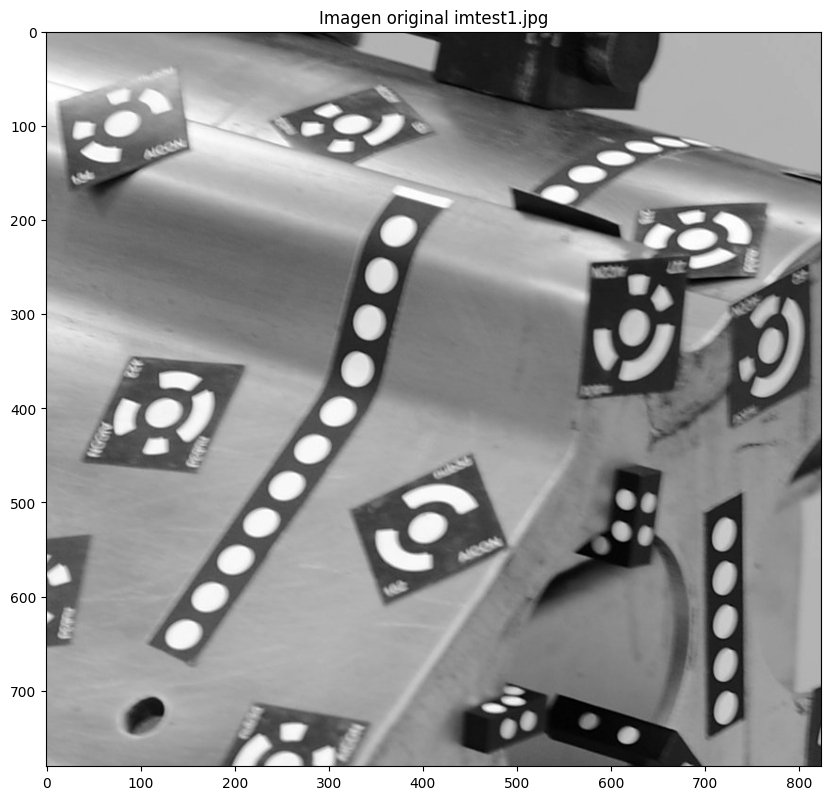

In [20]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest1.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros logGabor (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosLG = BkofLoGabor(imtest, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=1.5)

### Apartado b) **Cobertura espectral, cobertura con corte al 67%, forma espacial d elos filtros, filtros pares e impares y resultados de las convoluciones**

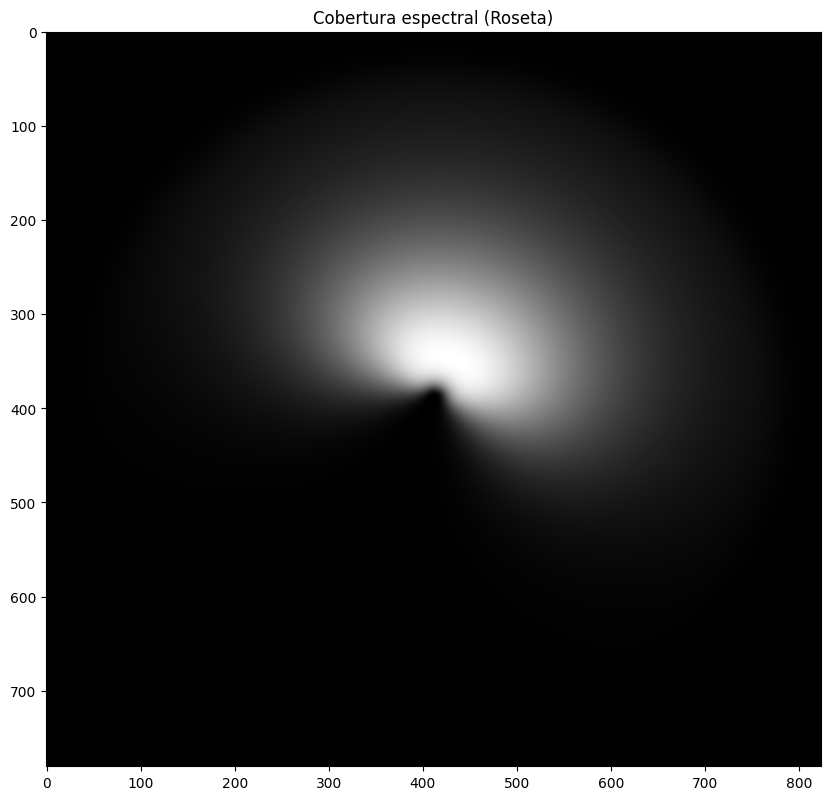

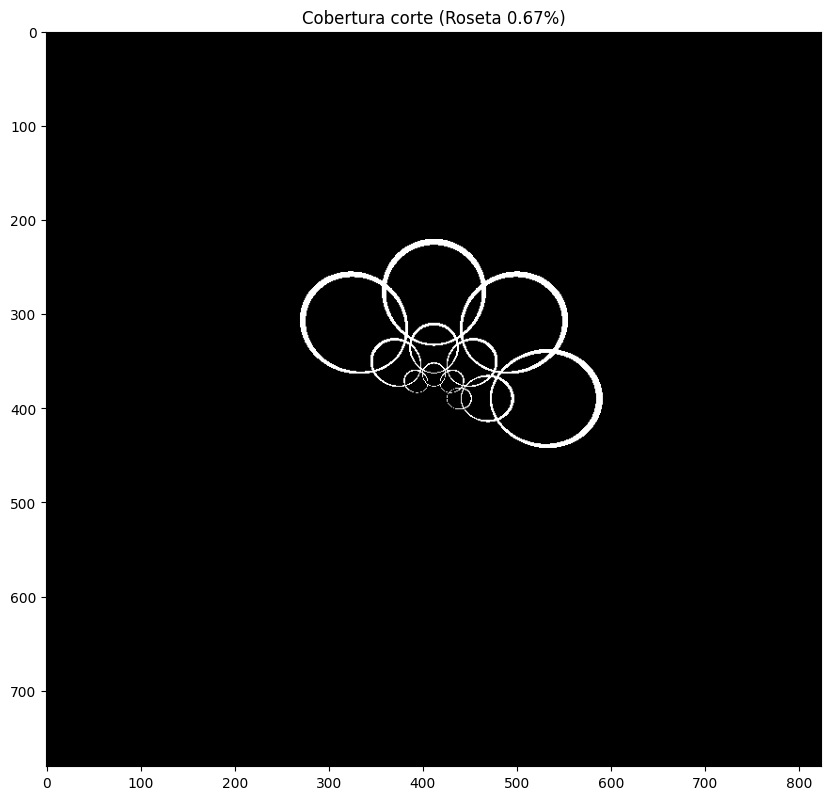

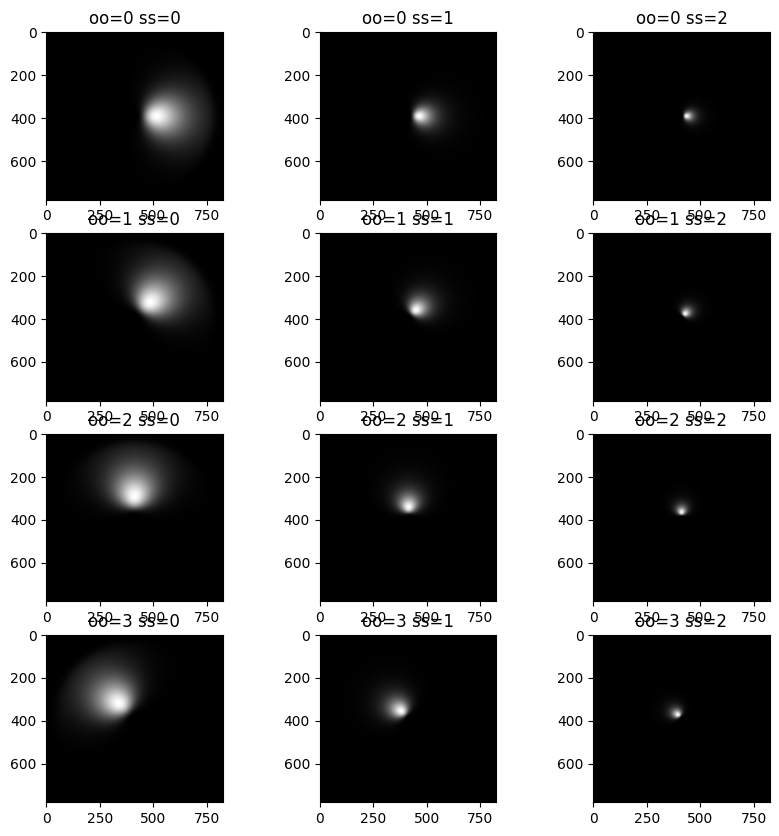

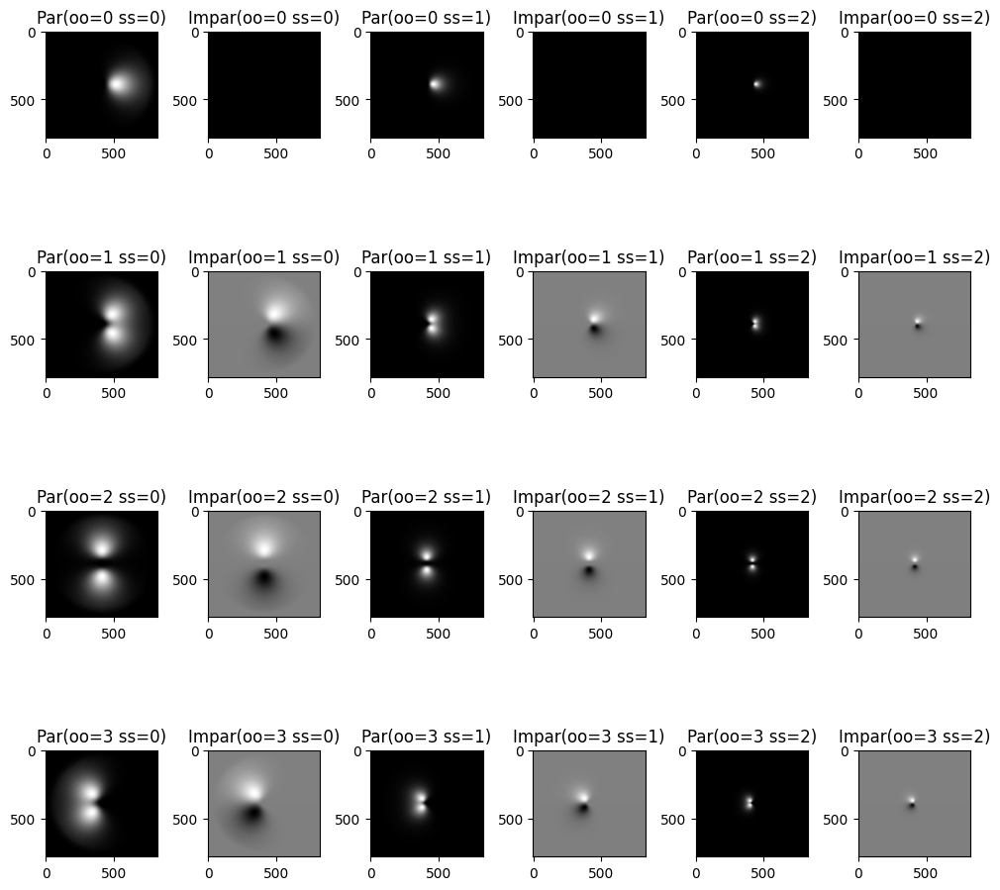

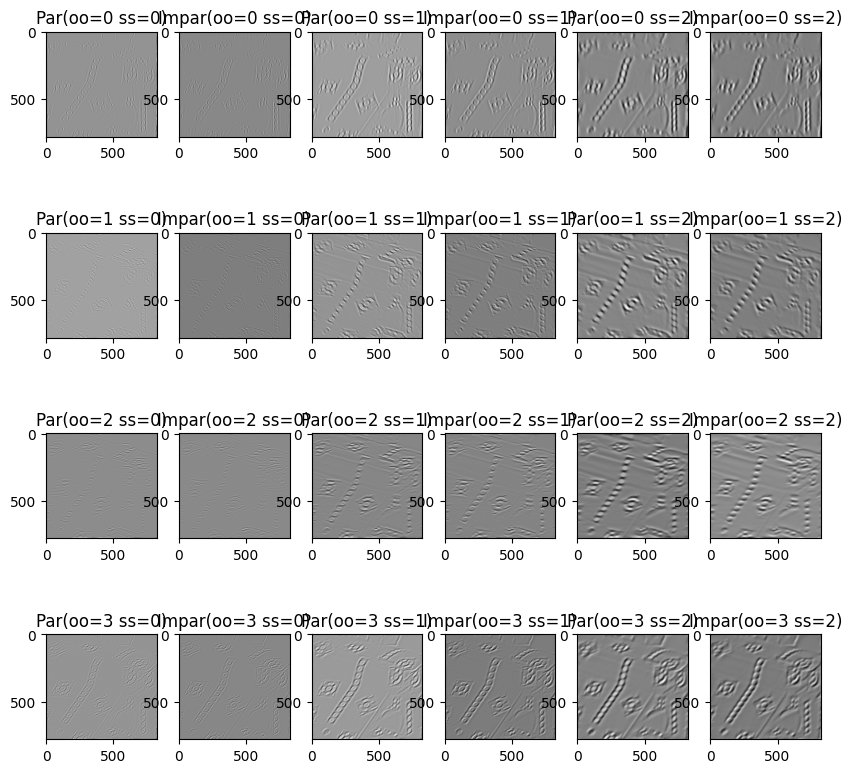

In [21]:
banco_filtrosLG.plot_cobertura_espectral()
banco_filtrosLG.plot_cobertura_corte()
banco_filtrosLG.plot_forma_espacial()
banco_filtrosLG.plot_filtros_par_impar()
banco_filtrosLG.plot_result_convoluciones_par_impar()

### Apartado c) **Energía y fase local (total y parcial)**

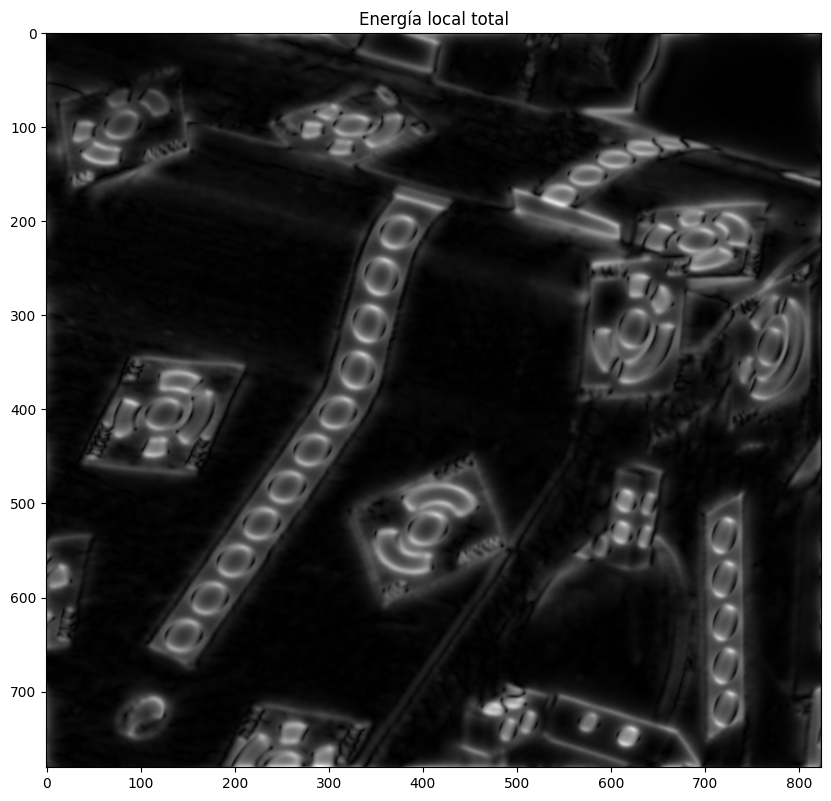

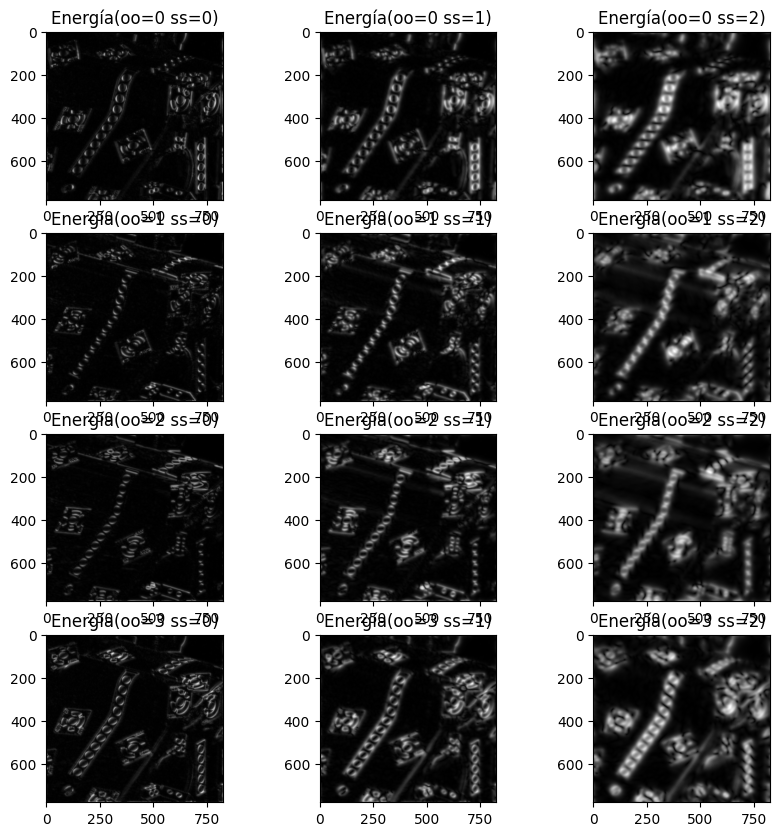

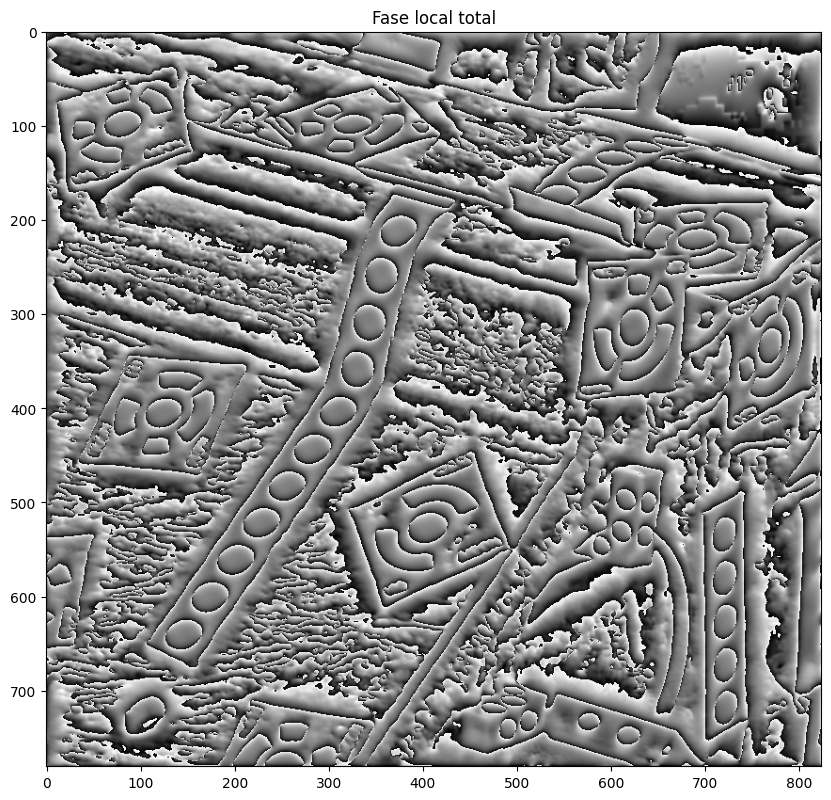

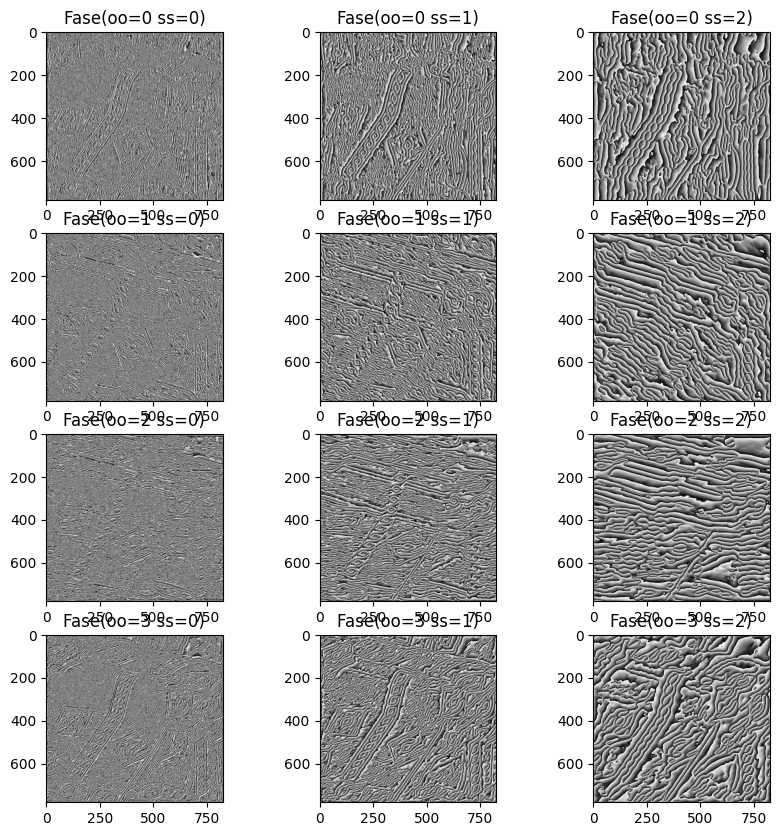

In [23]:
banco_filtrosLG.plot_energia_local_total()
banco_filtrosLG.plot_energia_local_parcial()
banco_filtrosLG.plot_fase_local_total()
banco_filtrosLG.plot_fase_local_parcial()

### Apartado d) **Reconstrucción de la imagen original**
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

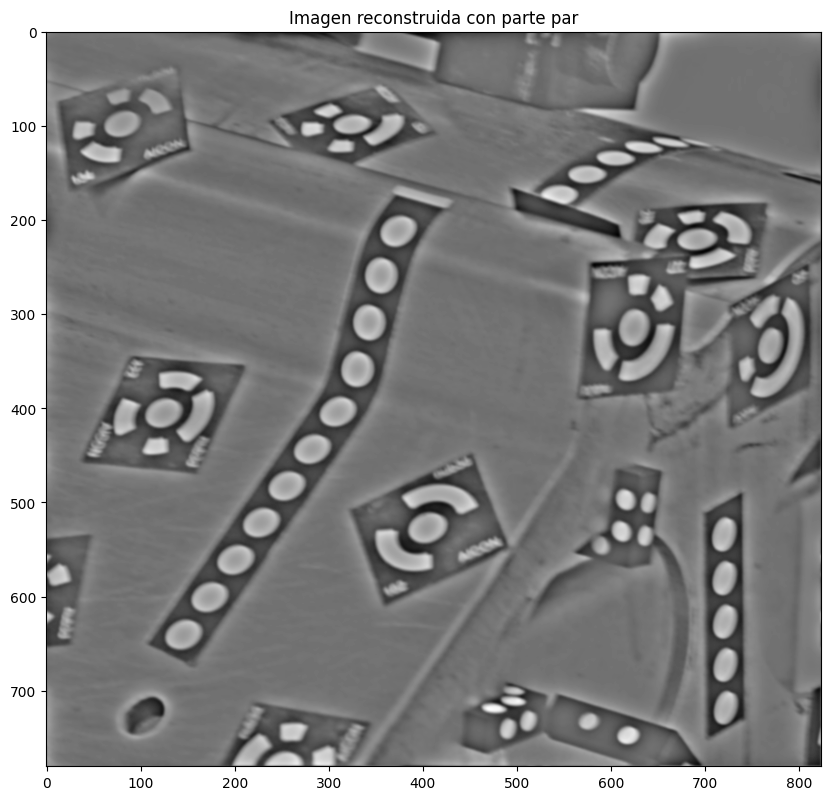

In [ ]:
banco_filtrosLG.plot_imagen_reconstruida()

### Apartado f) **Simetría radial**
Para este apartado modificaremos los parámetros de los filtros para obtener una mejor respuesta de la simetría radial

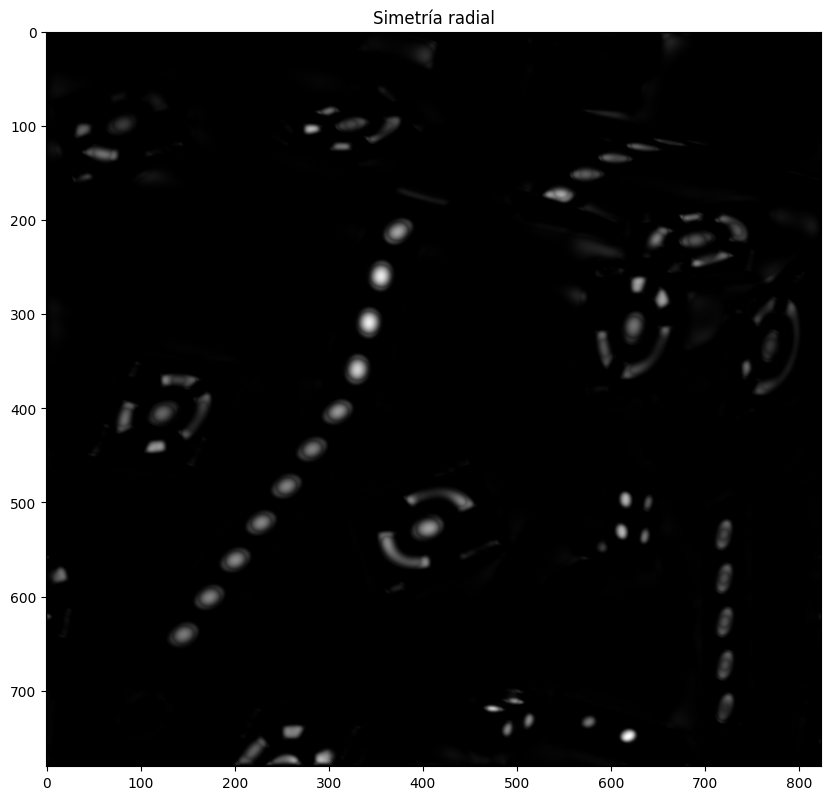

In [ ]:
banco_filtrosLG = BkofLoGabor(imtest, nscale=4, norient=3, minWaveLength=6, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=1.5)
banco_filtrosLG.plot_simetria_radial()

## Resultados para 'imtest2.jpg':

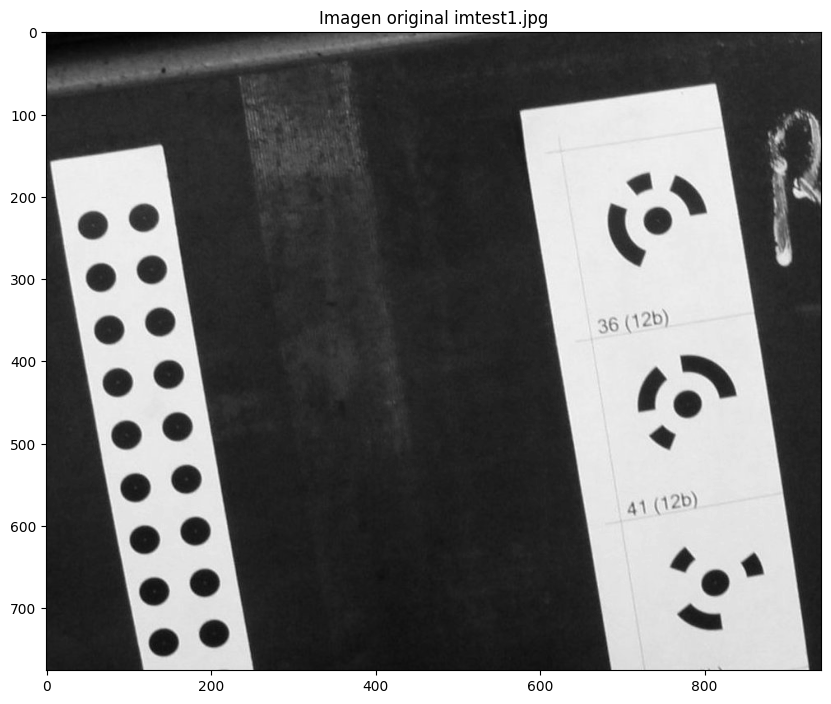

In [ ]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest2.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros logGabor (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosLG = BkofLoGabor(imtest, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=2.2)

### Apartado b) **Cobertura espectral, cobertura con corte al 67%, forma espacial d elos filtros, filtros pares e impares y resultados de las convoluciones**

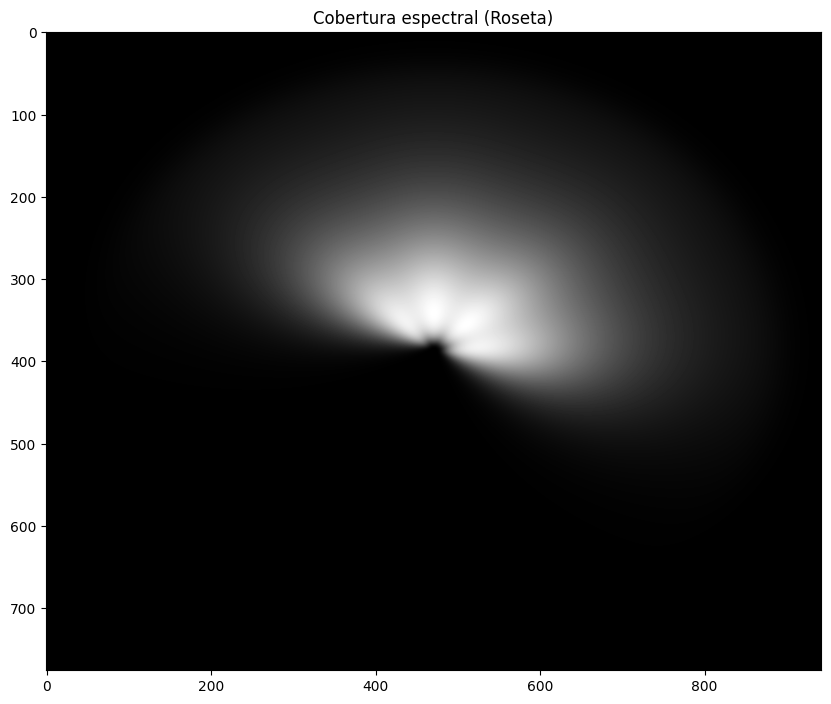

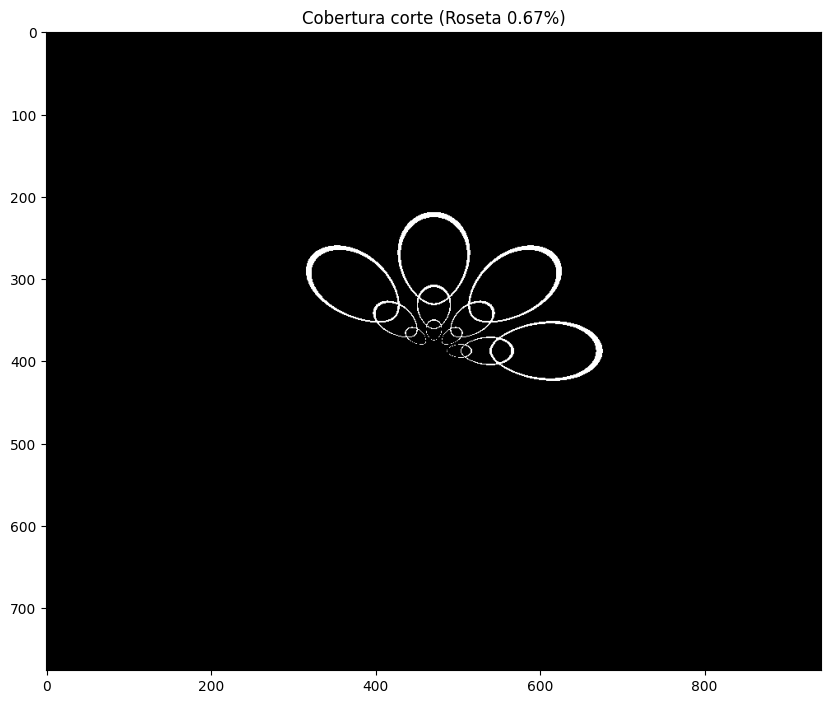

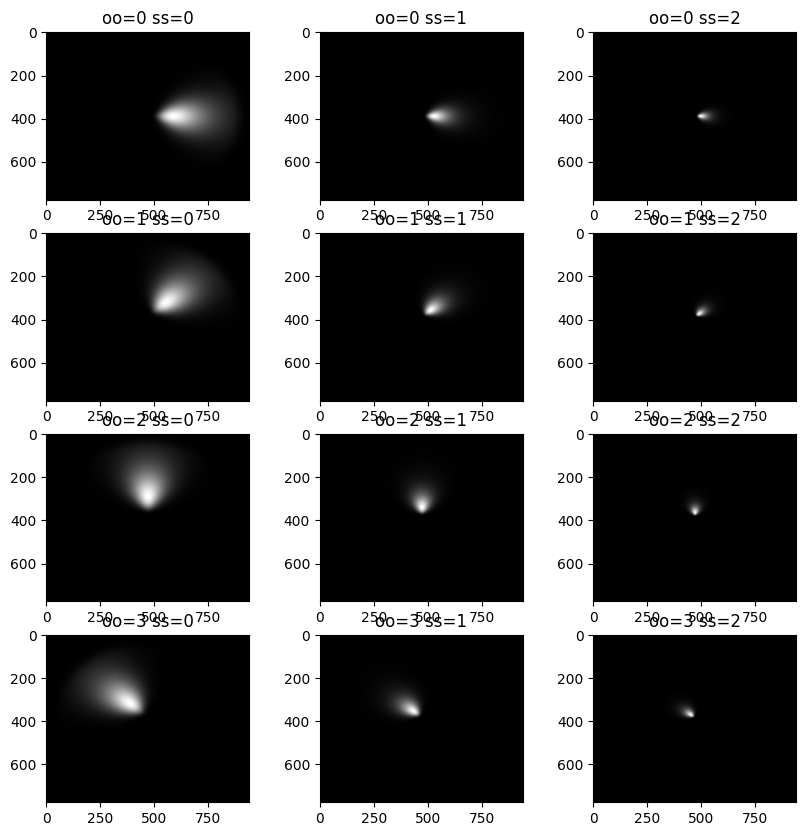

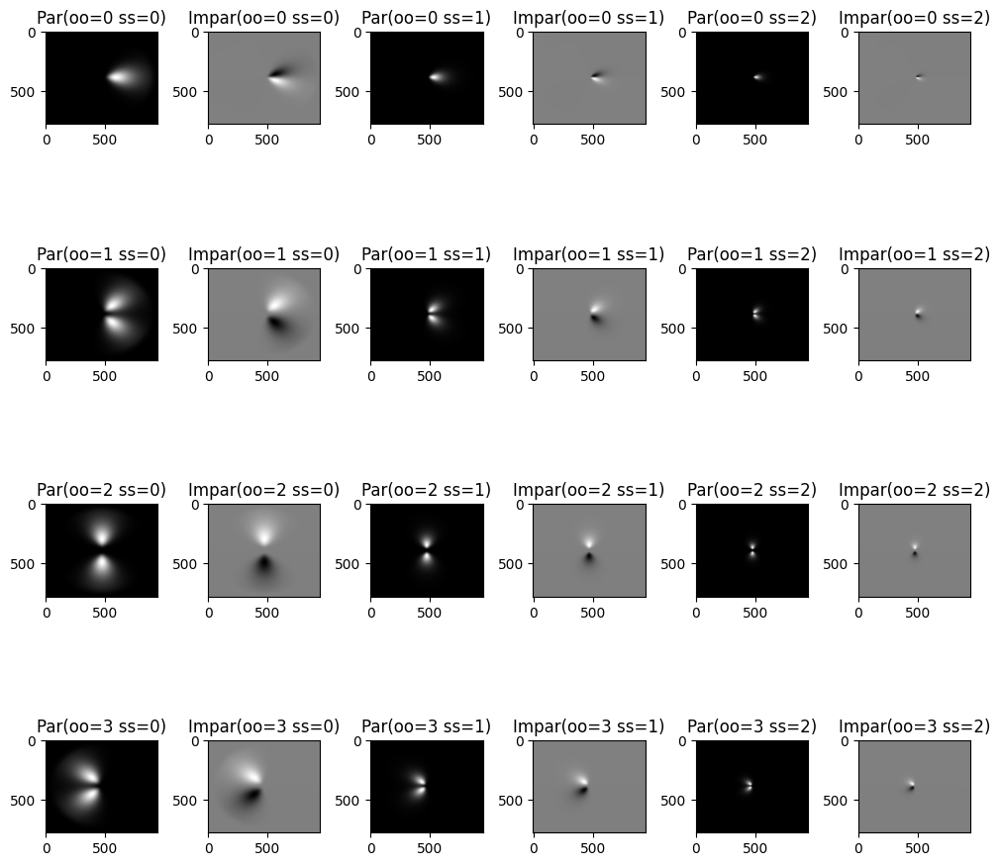

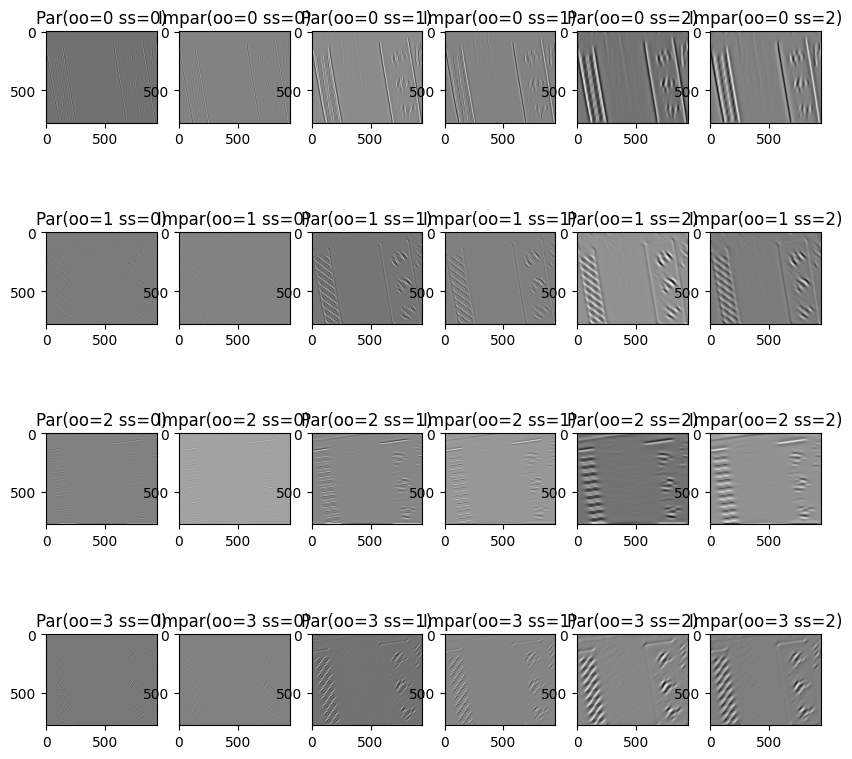

In [ ]:
banco_filtrosLG.plot_cobertura_espectral()
banco_filtrosLG.plot_cobertura_corte()
banco_filtrosLG.plot_forma_espacial()
banco_filtrosLG.plot_filtros_par_impar()
banco_filtrosLG.plot_result_convoluciones_par_impar()

### Apartado c) **Energía y fase local (total y parcial)**

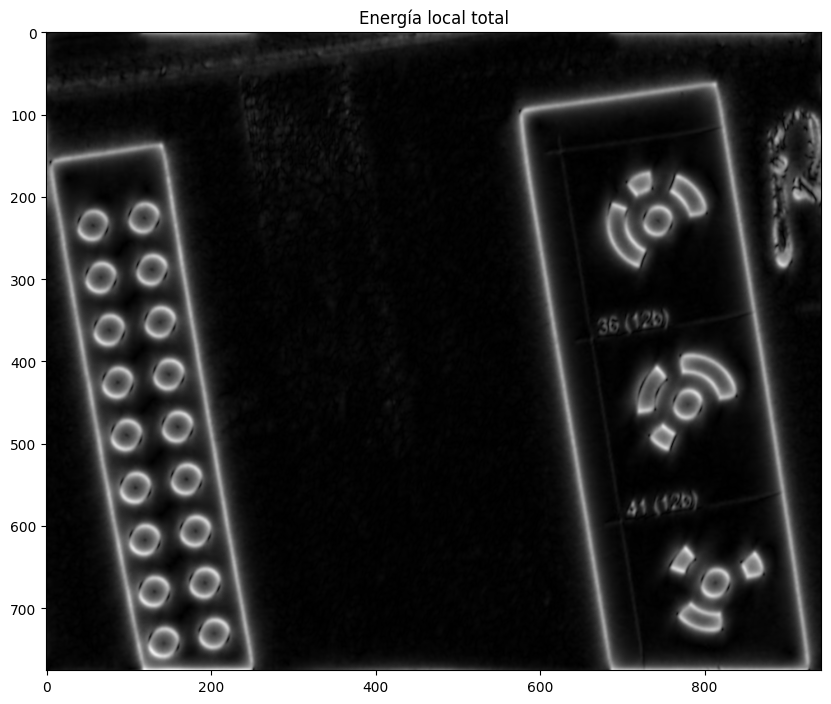

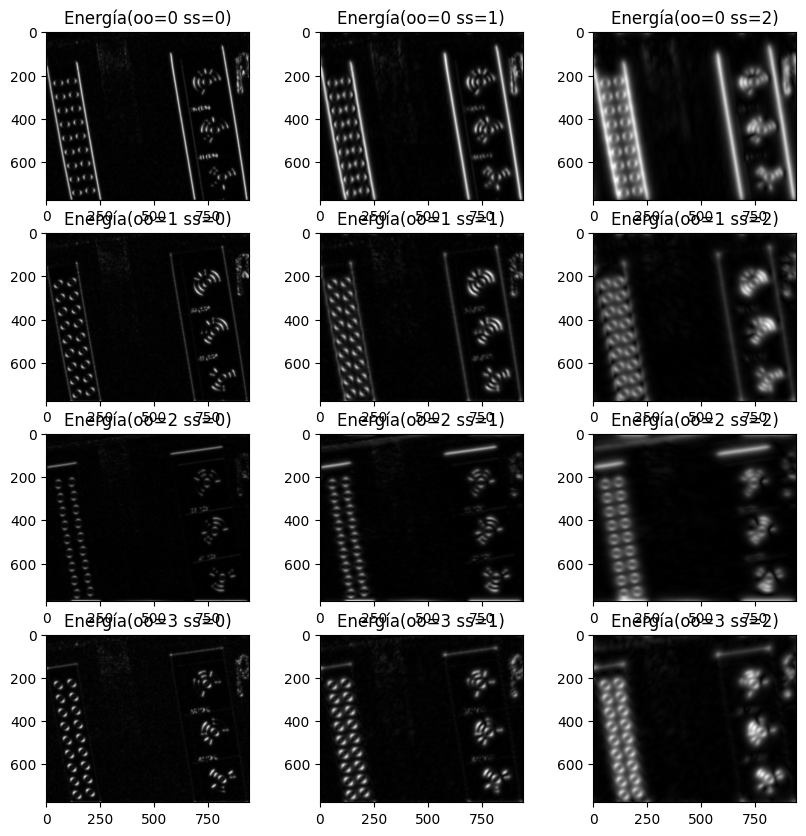

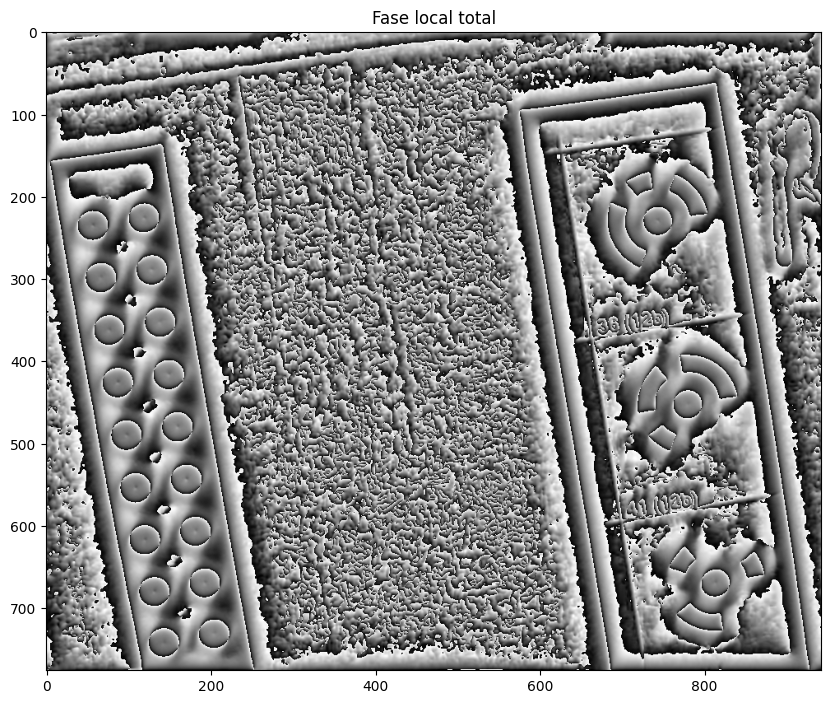

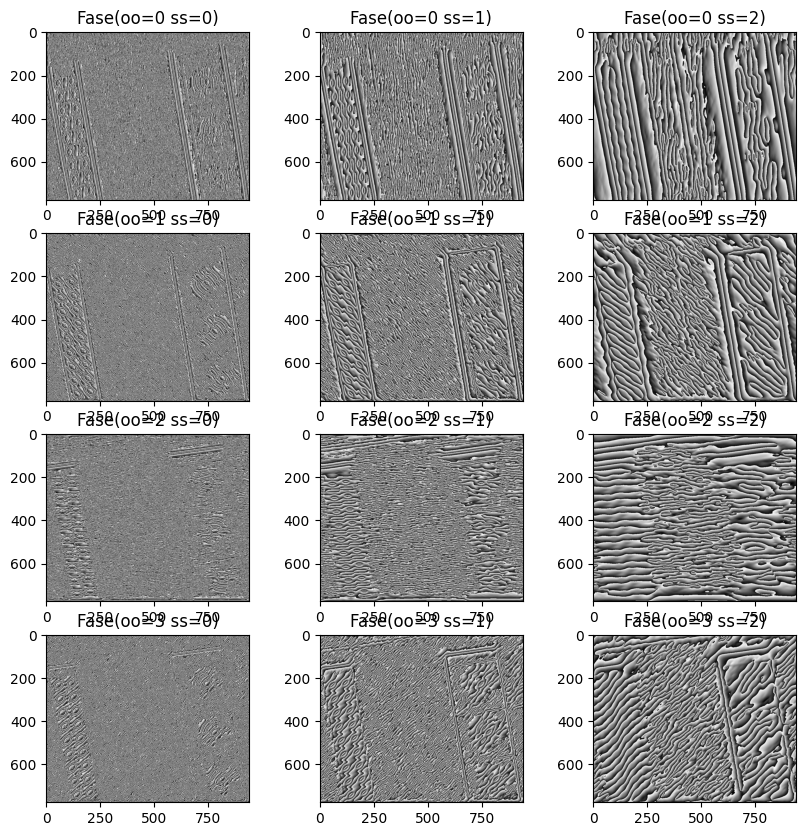

In [ ]:
banco_filtrosLG.plot_energia_local_total()
banco_filtrosLG.plot_energia_local_parcial()
banco_filtrosLG.plot_fase_local_total()
banco_filtrosLG.plot_fase_local_parcial()

### Apartado d) **Reconstrucción de la imagen original**
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

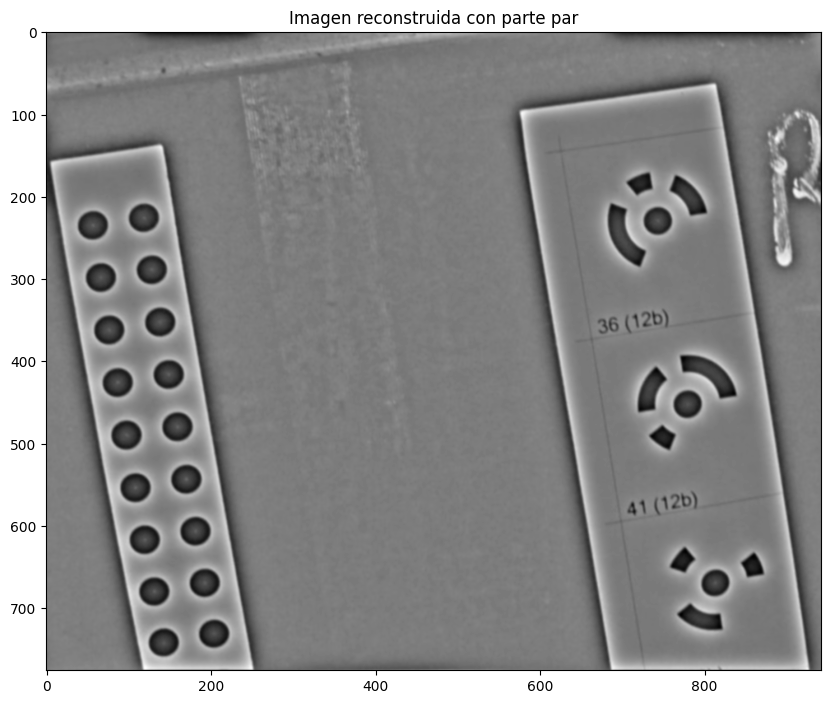

In [ ]:
banco_filtrosLG.plot_imagen_reconstruida()

### Apartado f) **Simetría radial**
Para este apartado modificaremos los parámetros de los filtros para obtener una mejor respuesta de la simetría radial.
Además se invertirán los colores de los resultados de las convoluciones, ya que en la imagen actual las formas fiduciales tienen la parte circular de color negro y cuando realicemos las multiplicaciones para obtener la simetría radial nos interesa quedarnos con los máximos (partes blancas).

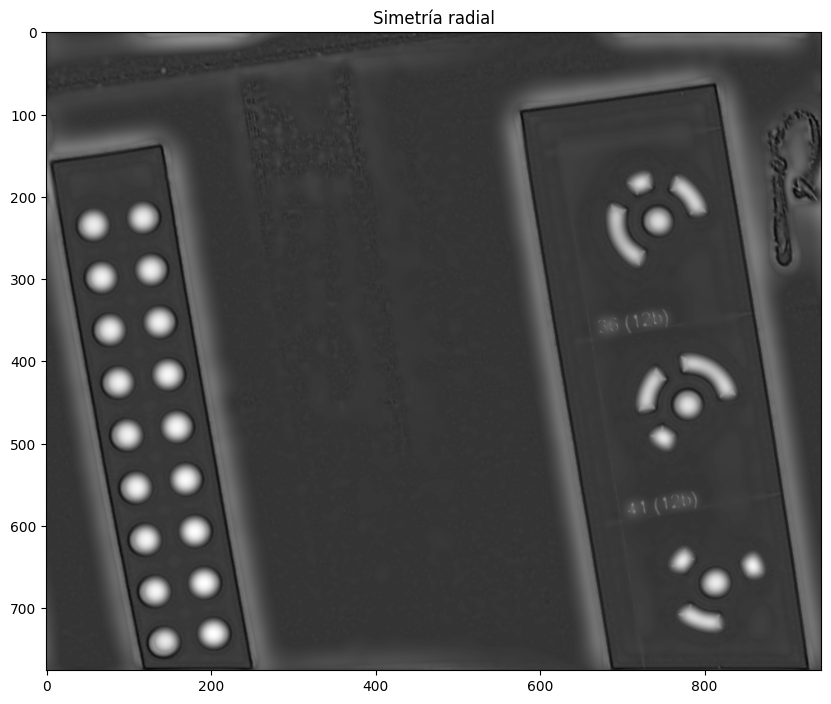

In [ ]:
banco_filtrosLG = BkofLoGabor(imtest, nscale=4, norient=3, minWaveLength=6, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=1.5)
banco_filtrosLG.plot_simetria_radial_con_inversion()

# Tarefa 2: Actividades cos filtros monogénicos

## Importamos las librerías necesarias

In [ ]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift
from IPython.display import display, Image

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

## Implementamos la clase "BkofMono"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- monogenicos(self) -> Crea el banco de filtros monogénicos con los parámetros de la clase

b)
- plot_cobertura_espectral(self) -> Visualiza la cobertura espectral de los filtros

- plot_forma_espacial(self) -> Visualiza la forma espacial de los filtros: par, impar 1 e impar 2

- plot_resultado_convoluciones2D(self) -> Visualiza el resultado de convolucionar los filtros con la imagen de entrada

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

- plot_orientacion_local_total(self) -> Visualiza la orientación local total de la imagen dada

- plot_orientacion_local_parcial(self) -> Visualiza la orientación local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

In [31]:
class BkofMono:
    def __init__(self, img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55):
        self.img = img
        self.nscale = nscale
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf

        self.rows, self.cols = self.img.shape

        #Comprobamos a paridade de filas e columnas para construir a grella
        # para determinar a parte radial de cada punto no espazo frecuencial
        #Normalizado entre [0,1]
        if (self.cols % 2): # Si cols impares
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if (self.rows % 2): # Si rows impares
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        self.logGabor = []
        self.go1_filt = []
        self.go2_filt = []
        self.filtrosPares = []
        self.filtrosImparesX = []
        self.filtrosImparesY = []

        # Llamammos al método para obtener los filtros monogenicos
        self.monogenicos()

    # Método para construir un filtro paso-bajo
    def lowpassfilter(self, cutoff, n):
        """
        Construimos un filtro paso-baixa de Butterworth con función de transferencia:

            f = 1 / (1 + (w/cutoff)^2n)

        usa:  f = lowpassfilter(cutoff, n)

        onde:   cutoff  é a frecuencia de corte do filtro entre 0 - 0.5
                n   é o orde do filtro, canto mais alto é n mais abruta é a transicion
                (n debe ser enteiro par maior que >= 1).

        OLLO: o orixe do filtro devolto esta na esquina superior.
        """

        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar 0 e 0.5')
        elif n % 1:
            raise Exception('n debe par e >= 1')

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)
        radius = np.sqrt(x * x + y * y)

        return ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear los filtros monogenicos
    def monogenicos(self):
        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)

        #coordendas planas: radio e angulo polar (sentido antihorario)
        radius = np.sqrt(x * x + y * y)
        radius = ifftshift(radius)
        radius[0, 0] = 1.

        matrix_X = -1j*x/radius
        matrix_Y = -1j*y/radius

        lp = self.lowpassfilter(.45, 15)

        # Achamos a transformda de Fourier da imaxe de entrada
        IM = fft2(self.img)

        for ss in range(self.nscale):
            waveLen = self.minWaveLength * self.mult ** ss
            wo = 1. / waveLen

            G = np.exp(-((np.log(radius / wo))**2) / (2. * np.log(self.sigmaOnf)**2.))
            G = G*lp
            G[0,0] = 0.

            go1 = G*matrix_X
            go2 = G*matrix_Y

            # Guardamos la forma espacial de los filtros
            self.logGabor.append(G)
            self.go1_filt.append(go1)
            self.go2_filt.append(go2)

            # Convolucionamos la imagen con los filtros
            result_radial = np.real(ifft2(IM*G))
            result_go1 = np.real(ifft2(IM*go1))
            result_go2 = np.real(ifft2(IM*go2))

            # Guardamos los resultados
            self.filtrosPares.append(result_radial)
            self.filtrosImparesX.append(result_go1)
            self.filtrosImparesY.append(result_go2)

        # Guardamos la cobertura espectral de los filtros
        self.filtroPar = ifftshift(sum(self.logGabor))
        self.filtroImparX = np.real(ifftshift(ifft2(matrix_X)))
        self.filtroImparY = np.real(ifftshift(ifft2(matrix_Y)))

    # b)
    def plot_cobertura_espectral(self):
        plt.figure()

        plt.subplot(1, 3, 1)
        plt.title('Filtro par')
        plt.imshow(self.filtroPar, cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Filtro impar X')
        plt.imshow(self.filtroImparX, cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title('Filtro impar Y')
        plt.imshow(self.filtroImparY, cmap='gray')

    def plot_forma_espacial(self):
        plt.figure()
        for ss in range(self.nscale):
            plt.subplot(self.nscale, 3, ss*3+1)
            plt.title('Par ss({})'.format(ss))
            plt.imshow(fftshift(np.real(self.logGabor[ss])), cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+2)
            plt.title('Impar X ss({})'.format(ss))
            plt.imshow(fftshift(np.imag(self.go1_filt[ss])), cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+3)
            plt.title('Impar Y ss({})'.format(ss))
            plt.imshow(fftshift(np.imag(self.go2_filt[ss])), cmap='gray')

    def plot_resultado_convoluciones2D(self):
        plt.figure()
        for ss in range(self.nscale):
            plt.subplot(self.nscale, 3, ss*3+1)
            plt.title('Gabor ss({})'.format(ss))
            plt.imshow(self.filtrosPares[ss], cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+2)
            plt.title('goX ss({})'.format(ss))
            plt.imshow(self.filtrosImparesX[ss], cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+3)
            plt.title('goY ss({})'.format(ss))
            plt.imshow(self.filtrosImparesY[ss], cmap='gray')

    # c)
    def plot_energia_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
        energia = amplitud**2

        plt.figure()
        plt.imshow(energia, cmap='gray')
        plt.title('Energía local total')

    def plot_energia_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
            energia = amplitud**2

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Energía local (ss={})'.format(ss))
            plt.imshow(energia, cmap='gray')

    def plot_fase_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        fo = np.sqrt(imparX**2 + imparY**2)
        fase = np.arctan2(par, fo)

        plt.figure()
        plt.imshow(fase, cmap='gray')
        plt.title('Fase local total')

    def plot_fase_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            fo = np.sqrt(imparX**2 + imparY**2)
            fase = np.arctan2(par, fo)

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Fase local (ss={})'.format(ss))
            plt.imshow(fase, cmap='gray')

    def plot_orientacion_local_total(self):
        imparX = 0
        imparY = 0  
        for ss in range(self.nscale):
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        orientacion = np.arctan(imparX/imparY)

        plt.figure()
        plt.imshow(orientacion, cmap='gray')
        plt.title('Orientacion local total')

    def plot_orientacion_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            orientacion = np.arctan(imparY/imparX)

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Orientacion local (ss={})'.format(ss))
            plt.imshow(orientacion, cmap='gray')

    # d)
    def plot_imagen_reconstruida(self):
        rebuild = 0
        for conv in self.filtrosPares:
            rebuild += np.real(conv)

        plt.figure()
        plt.imshow(rebuild, cmap='gray')
        plt.title('Imagen reconstruida con parte par')

## Visualización de los resultados:

## Resultados para 'imtest1.jpg':

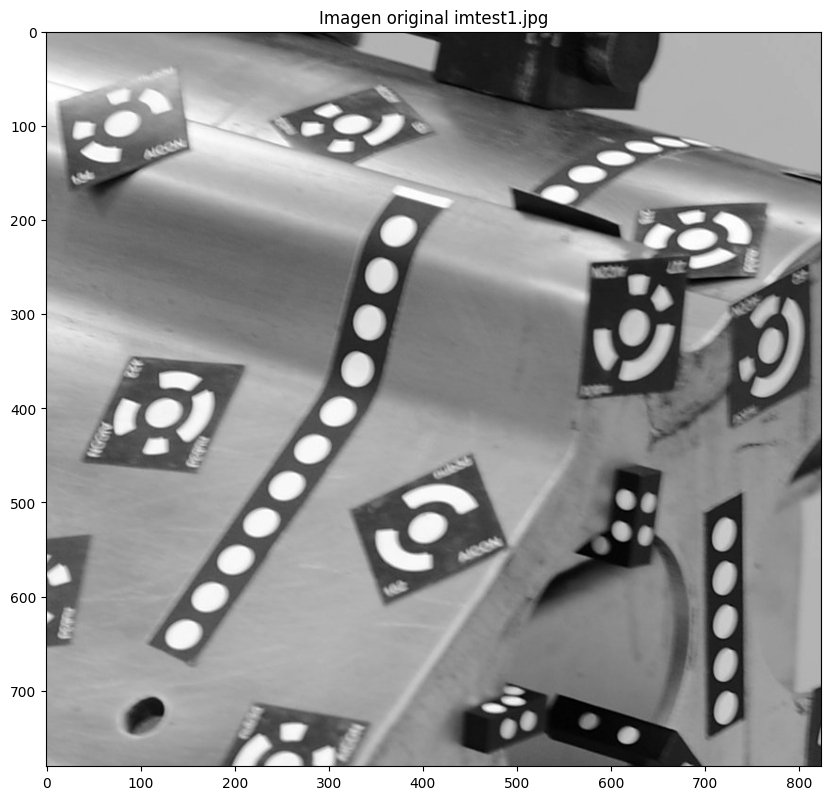

In [32]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest1.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros monoxénicos (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosMONO = BkofMono(imtest, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

### Apartado b) **Cobertura espectral, forma espacial de los filtros y resultados de las convoluciones**

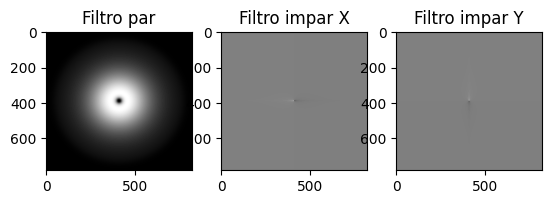

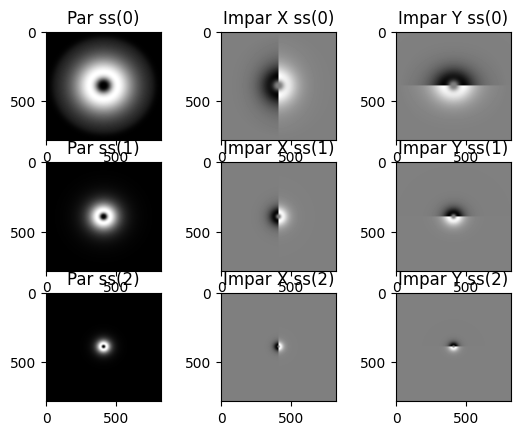

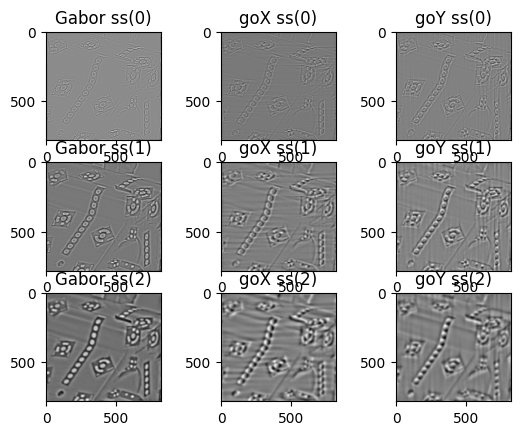

In [28]:
banco_filtrosMONO.plot_cobertura_espectral()
banco_filtrosMONO.plot_forma_espacial()
banco_filtrosMONO.plot_resultado_convoluciones2D()

### Apartado c) **Energía, fase y orientación local (total y parcial)**

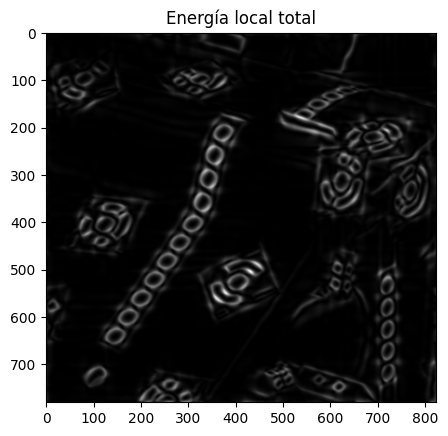

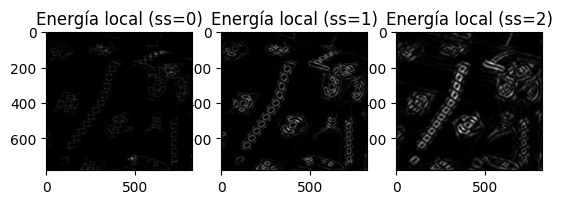

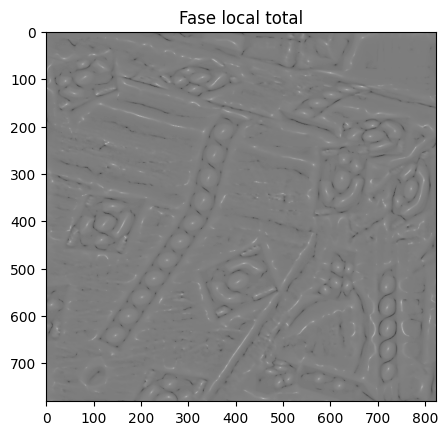

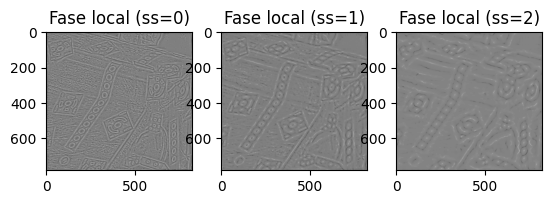

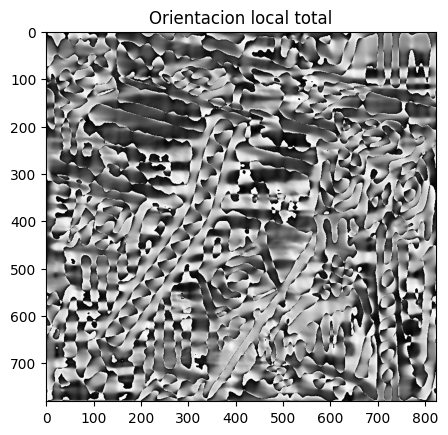

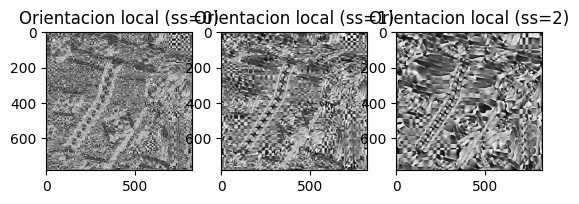

In [33]:
banco_filtrosMONO.plot_energia_local_total()
banco_filtrosMONO.plot_energia_local_parcial()
banco_filtrosMONO.plot_fase_local_total()
banco_filtrosMONO.plot_fase_local_parcial()
banco_filtrosMONO.plot_orientacion_local_total()
banco_filtrosMONO.plot_orientacion_local_parcial()

### Apartado d) **Reconstrucción de la imagen original**
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

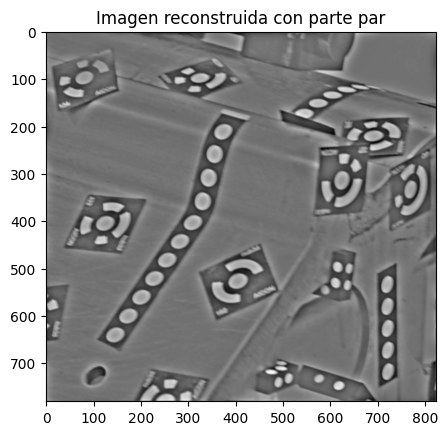

In [ ]:
banco_filtrosMONO.plot_imagen_reconstruida()

## Resultados para 'imtest2.jpg':

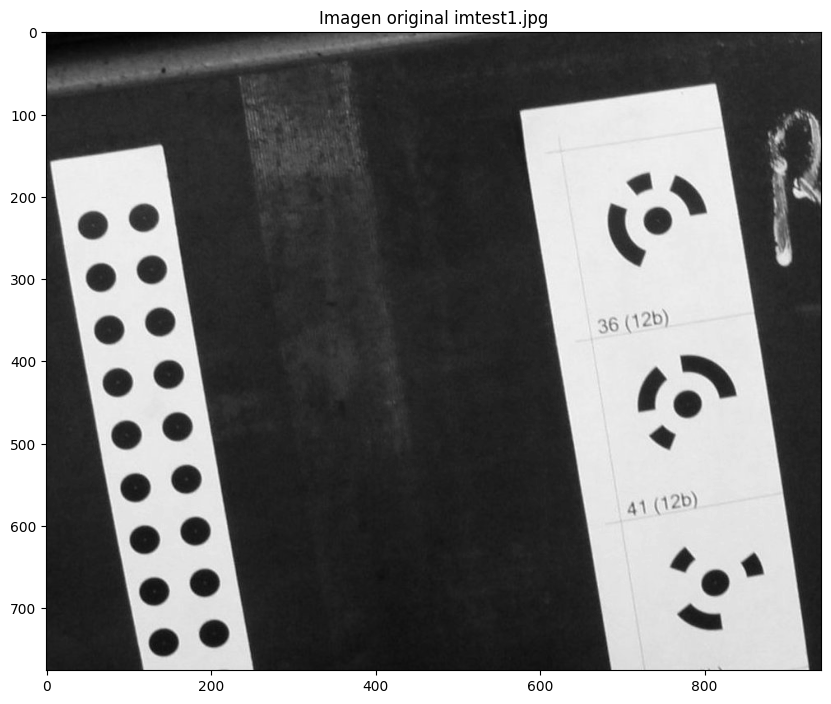

In [ ]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest2.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros monoxénicos (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosMONO = BkofMono(imtest, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

### Apartado b) **Cobertura espectral, forma espacial de los filtros y resultados de las convoluciones**

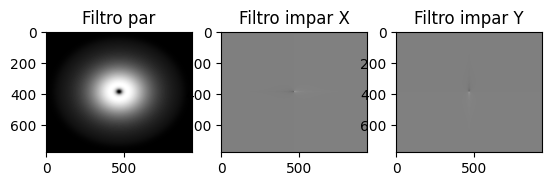

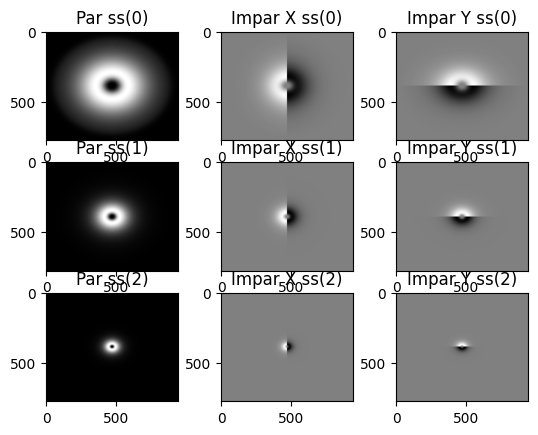

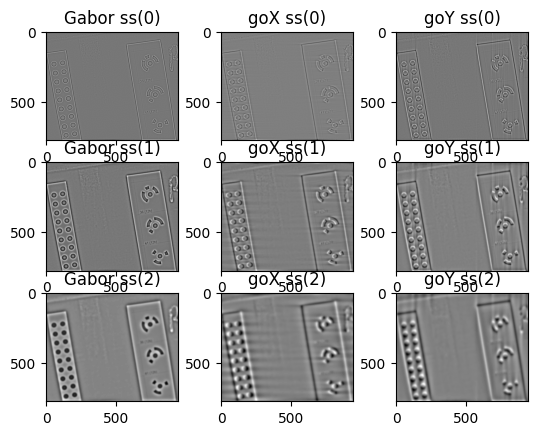

In [ ]:
banco_filtrosMONO.plot_cobertura_espectral()
banco_filtrosMONO.plot_forma_espacial()
banco_filtrosMONO.plot_resultado_convoluciones2D()

### Apartado c) **Energía, fase y orientación local (total y parcial)**

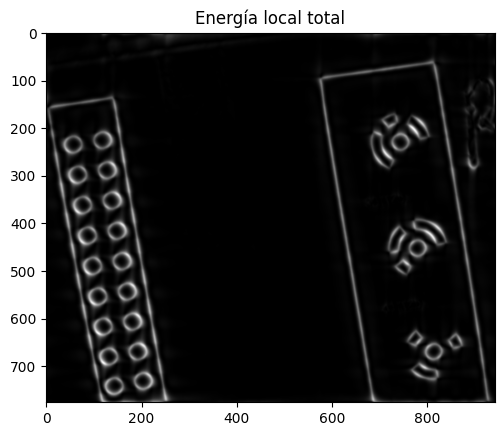

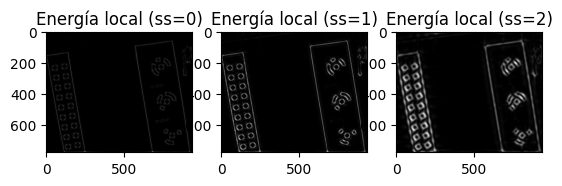

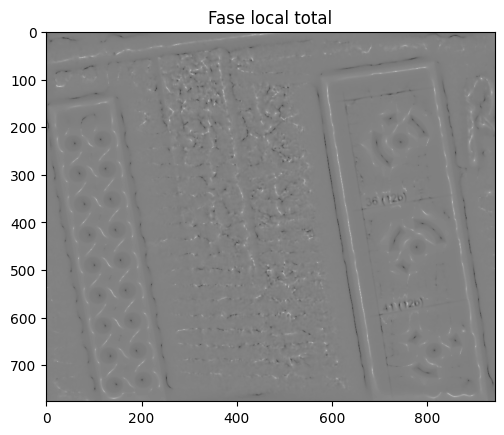

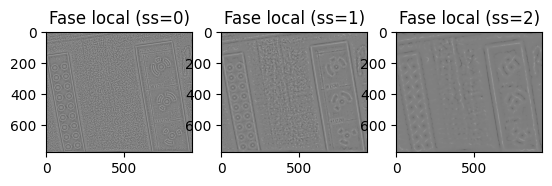

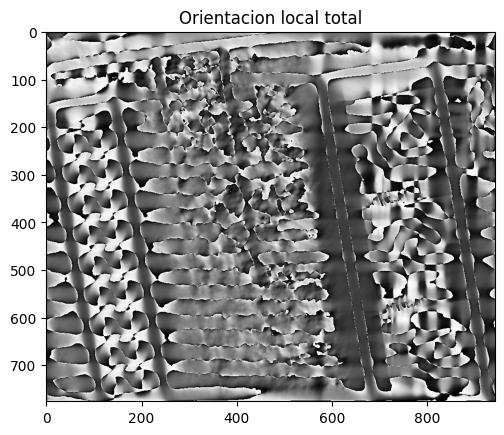

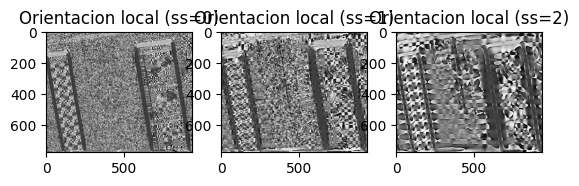

In [ ]:
banco_filtrosMONO.plot_energia_local_total()
banco_filtrosMONO.plot_energia_local_parcial()
banco_filtrosMONO.plot_fase_local_total()
banco_filtrosMONO.plot_fase_local_parcial()
banco_filtrosMONO.plot_orientacion_local_total()
banco_filtrosMONO.plot_orientacion_local_parcial()

### Apartado d) **Reconstrucción de la imagen original**
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

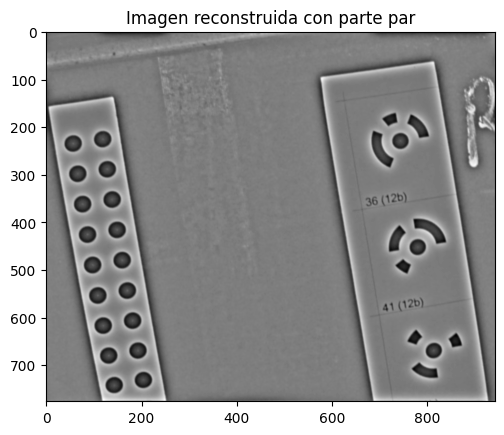

In [ ]:
banco_filtrosMONO.plot_imagen_reconstruida()

# Tarefa 2.e): Actividades cos filtros monogénicos 3D

## Importamos las librerías necesarias

In [ ]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift
import os

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2, fftn, ifftn
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


## Implementamos la clase "BkofMono3D"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- monogenicos3D(self) -> Crea el banco de filtros monogénicos con los parámetros de la clase

b)
- plot_cobertura_espectral(self) -> Visualiza la cobertura espectral de los filtros

- plot_forma_espacial(self) -> Visualiza la forma espacial de los filtros: par, impar 1 e impar 2

- plot_resultado_convoluciones3D(self) -> Visualiza el resultado de convolucionar los filtros con la imagen de entrada

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

- plot_orientacion_local_total(self) -> Visualiza la orientación local total de la imagen dada

- plot_orientacion_local_parcial(self) -> Visualiza la orientación local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

In [2]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift
import os
from IPython.display import Video

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2, fftn, ifftn
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2


# Función para cargar los frames de un video en un array de numpy
def read_video(video_path):
    video = cv2.VideoCapture(video_path)
    #print(video_path)
    if not video.isOpened():
        print("Error al abrir el video.")
        exit()

    # Almacenamos los frames del video en la lista
    frames = []
    while True:
        ret, frame = video.read()
        if not ret:
            break
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frames.append(gray)

    # Convertimos la lista de frames en un array de numpy
    frames_array = np.array(frames)

    video.release()

    return frames_array


class BkofMono3D:
    def __init__(self, video, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55):
        self.video = video
        self.nscale = nscale
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf

        self.frames, self.rows, self.cols = self.video.shape

        if self.cols % 2:
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if self.rows % 2:
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        if self.frames % 2:
            self.zvals = np.arange(-(self.frames - 1) / 2., ((self.frames - 1) / 2.) + 1) / float(self.frames - 1)
        else:
            self.zvals = np.arange(-self.frames / 2., self.frames / 2.) / float(self.frames)

        self.Ge_filt = []
        self.Go1_filt = []
        self.Go2_filt = []
        self.Go3_filt = []
        self.cobEspecPar = []
        self.cobEspecImparX = []
        self.cobEspecImparY = []
        self.cobEspecImparZ = []
        self.formEspacPar = []
        self.formEspacImparX = []
        self.formEspacImparY = []
        self.formEspacImparZ = []
        self.convPares = []
        self.convImparesX = []
        self.convImparesY = []
        self.convImparesZ = []

        # Llamammos al método para obtener los filtros monogenicos
        self.monogenicos3D()

    # Método para construir un filtro paso-bajo
    def lowpassfilter3D(self, cutoff, n):
        """
        Construye un filtro paso-bajo 3D de Butterworth
        """
        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar entre 0 y 0.5')
        elif n % 1:
            raise Exception('n debe ser par y >= 1')

        x, y, z = np.meshgrid(self.xvals, self.yvals, self.zvals, sparse=True)
        radius = np.sqrt(x * x + y * y + z * z)

        return np.fft.ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear los filtros monogenicos
    def monogenicos3D(self):
        x, y, z = np.meshgrid(self.xvals, self.yvals, self.zvals, sparse=True)

        radius = np.sqrt(x * x + y * y + z * z)
        radius = np.fft.ifftshift(radius)
        radius[0, 0, 0] = 1.

        Fo1 = -1j * x / radius
        Fo2 = -1j * y / radius
        Fo3 = -1j * z / radius

        Fo1 = np.transpose(Fo1, (2, 0, 1))
        Fo2 = np.transpose(Fo2, (2, 0, 1))
        Fo3 = np.transpose(Fo3, (2, 0, 1))

        lp = self.lowpassfilter3D(.5, 15)

        # Transformada de Fourier
        IM = np.fft.fftn(self.video)

        for ss in range(self.nscale):
            waveLen = self.minWaveLength * self.mult ** ss
            wo = 1. / waveLen

            G = np.exp(-((np.log(radius / wo))**2) / (2. * np.log(self.sigmaOnf)**2.))
            G = G * lp
            G[0, 0, 0] = 0.
            G = np.transpose(G, (2, 0, 1))

            Go1 = G * Fo1
            Go2 = G * Fo2
            Go3 = G * Fo3

            # Guardamos los filtros
            self.Ge_filt.append(G)
            self.Go1_filt.append(Go1)
            self.Go2_filt.append(Go2)
            self.Go3_filt.append(Go3)

            # Guardamos la cobertura espectral de los filtros
            self.cobEspecPar.append(np.real(np.fft.fftshift(G)))
            self.cobEspecImparX.append(np.imag(np.fft.fftshift(Go1)))
            self.cobEspecImparY.append(np.imag(np.fft.fftshift(Go2)))
            self.cobEspecImparZ.append(np.imag(np.fft.fftshift(Go3)))

            # Guardamos la forma espacial de los filtros
            self.formEspacPar.append(np.real(np.fft.fftshift(np.fft.ifftn(G))))
            self.formEspacImparX.append(np.real(np.fft.fftshift(np.fft.ifftn(Go1))))
            self.formEspacImparY.append(np.real(np.fft.fftshift(np.fft.ifftn(Go2))))
            self.formEspacImparZ.append(np.real(np.fft.fftshift(np.fft.ifftn(Go3))))

            # Guardamos los resultados de las convoluciones
            self.convPares.append(np.real(np.fft.ifftn(G * IM)))
            self.convImparesX.append(np.real(np.fft.ifftn(Go1 * IM)))
            self.convImparesY.append(np.real(np.fft.ifftn(Go2 * IM)))
            self.convImparesZ.append(np.real(np.fft.ifftn(Go3 * IM)))


    # Metodo que normaliza la imagen/el video dado
    def normaliza(self, x):
        return cv2.normalize(x, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    def reordena(self, x):
        return np.transpose(x, (1, 2, 0))

    # e.b)
    def cobertura_espectral(self):
        filtros = [self.cobEspecPar, self.cobEspecImparX, self.cobEspecImparY, self.cobEspecImparZ]
        lista_filtros = []
        for i in range(4):
            filtro_ss = []
            for ss in range(self.nscale):
                filtro_ss.append(self.normaliza(filtros[i][ss]))
            lista_filtros.append(cv2.hconcat(filtro_ss))

        return lista_filtros

    def forma_espacial(self):
        filtros = [self.formEspacPar, self.formEspacImparX, self.formEspacImparY, self.formEspacImparZ]
        lista_filtros = []
        for i in range(4):
            filtro_ss = []
            for ss in range(self.nscale):
                filtro_ss.append(self.normaliza(filtros[i][ss]))
            lista_filtros.append(cv2.hconcat(filtro_ss))

        return lista_filtros

    def resultado_convoluciones3D(self):
        filtros = [self.convPares, self.convImparesX, self.convImparesY, self.convImparesZ]
        lista_filtros = []
        for i in range(4):
            filtro_ss = []
            for ss in range(self.nscale):
                filtro_ss.append(self.normaliza(filtros[i][ss]))
            lista_filtros.append(cv2.hconcat(filtro_ss))

        return lista_filtros

    # e.c)
    def energia_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        imparZ = 0
        for ss in range(self.nscale):
            par += self.convPares[ss]
            imparX += self.convImparesX[ss]
            imparY += self.convImparesY[ss]
            imparZ += self.convImparesZ[ss]

        amplitud = np.sqrt(par**2 + imparX**2 + imparY**2 + imparZ**2)
        energia = amplitud**2
        return self.normaliza(energia)

    def energia_local_parcial(self):
        energias = []
        for ss in range(self.nscale):
            par = self.convPares[ss]
            imparX = self.convImparesX[ss]
            imparY = self.convImparesY[ss]
            imparZ = self.convImparesZ[ss]

            amplitud = np.sqrt(par**2 + imparX**2 + imparY**2 + imparZ**2)
            energia_ss = amplitud**2
            energias.append(self.normaliza(energia_ss))

        return cv2.hconcat(energias)

    def fase_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        imparZ = 0
        for ss in range(self.nscale):
            par += self.convPares[ss]
            imparX += self.convImparesX[ss]
            imparY += self.convImparesY[ss]
            imparZ += self.convImparesZ[ss]

        fo = np.sqrt(imparX**2 + imparY**2 + imparZ**2)
        fase = np.arctan2(par, fo)
        return self.normaliza(fase)

    def fase_local_parcial(self):
        fases = []
        for ss in range(self.nscale):
            par = self.convPares[ss]
            imparX = self.convImparesX[ss]
            imparY = self.convImparesY[ss]
            imparZ = self.convImparesZ[ss]

            fo = np.sqrt(imparX**2 + imparY**2 + imparZ**2)
            fase_ss = np.arctan2(par, fo)
            fases.append(self.normaliza(fase_ss))

        return cv2.hconcat(fases)

    def orientacionXY_local_total(self):
        imparX = 0
        imparY = 0  
        for ss in range(self.nscale):
            imparX += self.convImparesX[ss]
            imparY += self.convImparesY[ss]

        orientacion = np.arctan(imparY/imparX)
        return self.normaliza(orientacion)

    def orientacionXY_local_parcial(self):
        orientaciones = []
        for ss in range(self.nscale):
            imparX = self.convImparesX[ss]
            imparY = self.convImparesY[ss]

            orientacion_ss = np.arctan(imparY/imparX)
            orientaciones.append(self.normaliza(orientacion_ss))

        return cv2.hconcat(orientaciones)

    def orientacionYZ_local_total(self):
        imparY = 0  
        imparZ = 0
        for ss in range(self.nscale):
            imparY += self.convImparesY[ss]
            imparZ += self.convImparesZ[ss]

        orientacion = np.arctan(imparY/imparZ)
        return self.normaliza(orientacion)

    def orientacionYZ_local_parcial(self):
        orientaciones = []
        for ss in range(self.nscale):
            imparY = self.convImparesY[ss]
            imparZ = self.convImparesZ[ss]

            orientacion_ss = np.arctan(imparY/imparZ)
            orientaciones.append(self.normaliza(orientacion_ss))

        return cv2.hconcat(orientaciones)

    def orientacionXZ_local_total(self):
        imparX = 0
        imparZ = 0
        for ss in range(self.nscale):
            imparX += self.convImparesX[ss]
            imparZ += self.convImparesZ[ss]

        orientacion = np.arctan(imparZ/imparX)
        return self.normaliza(orientacion)

    def orientacionXZ_local_parcial(self):
        orientaciones = []
        for ss in range(self.nscale):
            imparX = self.convImparesX[ss]
            imparZ = self.convImparesZ[ss]

            orientacion_ss = np.arctan(imparZ/imparX)
            orientaciones.append(self.normaliza(orientacion_ss))

        return cv2.hconcat(orientaciones)

    # e.d)
    def reconstruye_imagen(self):
        rebuild = 0
        for ss in range(self.nscale):
            rebuild += np.real(self.convPares[ss])

        return self.normaliza(rebuild)

/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


## **NOTA: Para la visualización de los resultados del banco de filtros monogénicos 3D no es necesario ejecutar ningún Kernel, en la parte inferior de cada apartado (e.b, e.c, e.d) se encuentra un Kernel con la grabación de los resultados.**

## Resultados para los videos de la base de datos

In [2]:
# Leemos los videos de la base de datos y visualizamos los resultados
videos_dir = "../datatest/videos/"
videos_list = os.listdir(videos_dir)

### **Cobertura espectral**

In [25]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    cobertura_espectral = banco_filtrosMONO3D.cobertura_espectral()

    for filtro in cobertura_espectral:
        for frame in filtro:
            cv2.imshow('Cobertura espectral {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

: 

: 

#### Grabaciones:

In [8]:
videos = [
    './results/Cobertura_espectral/SCD_circulos_1sentido_contrario.mp4',
    './results/Cobertura_espectral/SCE_circulos_girando_3.mp4',
    './results/Cobertura_espectral/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Forma espacial**

In [5]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    forma_espacial = banco_filtrosMONO3D.forma_espacial()

    for filtro in forma_espacial:
        for frame in filtro:
            cv2.imshow('Forma espacial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

KeyboardInterrupt: 

#### Grabaciones:

In [7]:
videos = [
    './results/Forma_espacial/SCD_circulos_1sentido_contrario.mp4',
    './results/Forma_espacial/SCE_circulos_girando_3.mp4',
    './results/Forma_espacial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Resultado convoluciones**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    result_convoluciones = banco_filtrosMONO3D.resultado_convoluciones3D()

    for filtro in result_convoluciones:
        for frame in filtro:
            cv2.imshow('Resultado convoluciones {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

#### Grabaciones:

In [9]:
videos = [
    './results/Resultado_convoluciones/SCD_circulos_1sentido_contrario.mp4',
    './results/Resultado_convoluciones/SCE_circulos_girando_3.mp4',
    './results/Resultado_convoluciones/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Energía local total**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    energia_total = banco_filtrosMONO3D.energia_local_total()

    for frame in energia_total:
        cv2.imshow('Energía local total {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

#### Grabaciones:

In [20]:
videos = [
    './results/Energia_local_total/SCD_circulos_1sentido_contrario.mp4',
    './results/Energia_local_total/SCE_circulos_girando_3.mp4',
    './results/Energia_local_total/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Energía local parcial**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    energia_parcial = banco_filtrosMONO3D.energia_local_parcial()

    for escala in energia_parcial:
        for frame in escala:
            cv2.imshow('Energía local parcial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

#### Grabaciones:

In [19]:
videos = [
    './results/Energia_local_parcial/SCD_circulos_1sentido_contrario.mp4',
    './results/Energia_local_parcial/SCE_circulos_girando_3.mp4',
    './results/Energia_local_parcial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Fase local total**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    fase_total = banco_filtrosMONO3D.fase_local_total()

    for frame in fase_total:
        cv2.imshow('Fase local total {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

#### Grabaciones:

In [18]:
videos = [
    './results/Fase_local_total/SCD_circulos_1sentido_contrario.mp4',
    './results/Fase_local_total/SCE_circulos_girando_3.mp4',
    './results/Fase_local_total/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Fase local parcial**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    fase_parcial = banco_filtrosMONO3D.fase_local_parcial()

    for escala in fase_parcial:
        for frame in escala:
            cv2.imshow('Fase local parcial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

#### Grabaciones:

In [17]:
videos = [
    './results/Fase_local_parcial/SCD_circulos_1sentido_contrario.mp4',
    './results/Fase_local_parcial/SCE_circulos_girando_3.mp4',
    './results/Fase_local_parcial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (XY) local total**

In [25]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionXY_total = banco_filtrosMONO3D.orientacionXY_local_total()

    for frame in orientacionXY_total:
        cv2.imshow('Orientación XY local total {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

KeyboardInterrupt: 

#### Grabaciones:

In [16]:
videos = [
    './results/Orientacion_XY_local_total/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_XY_local_total/SCE_circulos_girando_3.mp4',
    './results/Orientacion_XY_local_total/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (XY) local parcial**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionXY_parcial = banco_filtrosMONO3D.orientacionXY_local_parcial()

    for escala in orientacionXY_parcial:
        for frame in escala:
            cv2.imshow('Orientación XY local parcial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

#### Grabaciones:

In [15]:
videos = [
    './results/Orientacion_XY_local_parcial/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_XY_local_parcial/SCE_circulos_girando_3.mp4',
    './results/Orientacion_XY_local_parcial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (YZ) local total**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionYZ_total = banco_filtrosMONO3D.orientacionYZ_local_total()

    for frame in orientacionYZ_total:
        cv2.imshow('Orientación YZ local total {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

#### Grabaciones:

In [14]:
videos = [
    './results/Orientacion_YZ_local_total/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_YZ_local_total/SCE_circulos_girando_3.mp4',
    './results/Orientacion_YZ_local_total/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (YZ) local parcial**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionYZ_parcial = banco_filtrosMONO3D.orientacionYZ_local_parcial()

    for escala in orientacionYZ_parcial:
        for frame in escala:
            cv2.imshow('Orientación YZ local parcial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

#### Grabaciones:

In [13]:
videos = [
    './results/Orientacion_YZ_local_parcial/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_YZ_local_parcial/SCE_circulos_girando_3.mp4',
    './results/Orientacion_YZ_local_parcial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (XZ) local total**

In [ ]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionXZ_total = banco_filtrosMONO3D.orientacionXZ_local_total()

    for frame in orientacionXZ_total:
        cv2.imshow('Orientación XZ local total {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

#### Grabaciones:

In [12]:
videos = [
    './results/Orientacion_XZ_local_total/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_XZ_local_total/SCE_circulos_girando_3.mp4',
    './results/Orientacion_XZ_local_total/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Orientación (XZ) local parcial**

In [17]:
for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=2, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # Mostramos los resultados:
    orientacionXZ_parcial = banco_filtrosMONO3D.orientacionXZ_local_parcial()

    for escala in orientacionXZ_parcial:
        for frame in escala:
            cv2.imshow('Orientación XZ local parcial {}'.format(video_name), frame)

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break
    cv2.destroyAllWindows()

: 

: 

#### Grabaciones:

In [11]:
videos = [
    './results/Orientacion_XZ_local_parcial/SCD_circulos_1sentido_contrario.mp4',
    './results/Orientacion_XZ_local_parcial/SCE_circulos_girando_3.mp4',
    './results/Orientacion_XZ_local_parcial/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))

### **Reconstrucción de la imagen original**

Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

In [8]:
# Leemos los videos de la base de datos y visualizamos los resultados
videos_dir = "../datatest/videos/"
videos_list = os.listdir(videos_dir)

for video_name in videos_list:
    video_path = os.path.join(videos_dir, video_name)

    # Leemos el video
    frames_array = read_video(video_path)

    # Construimos el banco de filtros
    banco_filtrosMONO3D = BkofMono3D(frames_array, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

    # RECONSTRUCCIÓN DE LA IMAGEN
    reconstruccion = banco_filtrosMONO3D.reconstruye_imagen()

    for frame in frames_array:
        cv2.imshow('Reconstrucción con parte par {}'.format(video_name), frame)

        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()

KeyboardInterrupt: 

#### Grabaciones:

In [10]:
videos = [
    './results/Reconstruccion_imagen_original/SCD_circulos_1sentido_contrario.mp4',
    './results/Reconstruccion_imagen_original/SCE_circulos_girando_3.mp4',
    './results/Reconstruccion_imagen_original/SCE_bur_11_girando.mp4'
]

for video_path in videos:
    display(Video(video_path))